# Common code and variables

In [40]:
%%capture
%pip install plotly pandas numpy matplotlib seaborn ipympl itables ipykernel tex latex

#  sudo apt-get install texlive  dvipng  cm-super texlive-latex-extra texlive-fonts-recommended 


In [ ]:
%matplotlib widget

# pathData = '/mnt/unison-box/dropbox/Coop-projekte/kit-ipe-sciTS/'
pathData = '/mnt/macos/'
path = './graphs/'


import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib as mpl
# Use the pgf backend (must be set before pyplot imported)
# mpl.use('pgf')

from datetime import datetime as dt
import math

 
from matplotlib import pyplot as plt, ticker
import seaborn as sns
import itables as it
from itables import init_notebook_mode, show 
init_notebook_mode(all_interactive=True)
sns.set_theme(style="whitegrid")
# plt.style.use('seaborn')

sns.set(font_scale=4)

width = 800

tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family":  "serif",
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 20,
    "font.size": 18,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 16,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16
}

plt.rcParams.update(tex_fonts)

In [ ]:
def set_size(width, fraction=1, subplots=(1, 1)):
    """Set figure dimensions to avoid scaling in LaTeX.

    Parameters
    ----------
    width: float or string
            Document width in points, or string of predined document type
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy
    subplots: array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    elif width == 'acm':
        width_pt = 506.295
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 + 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in / golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)

In [ ]:
databases = {'ClickhouseDB': '#orange',
             'ClickHouse': '#orange',
             'DatalayertsDB': '#75BDA7',
             'TimescaleDB': '#c78181',
             'InfluxDB': '#c78351',
             'PostgresDB': 'orange', }
databases_modes = {'ClickhouseDB_dedicated_regular': '#75BBA1',
                   'ClickhouseDB_dedicated_irregular': '#c77581',
                   'DatalayertsDB_dedicated_regular': '#75BDA7',
                   'DatalayertsDB_dedicated_irregular': '#75BBA1',
                   'TimescaleDB_dedicated_regular': '#c78181',
                   'TimescaleDB_dedicated_irregular': '#c78242',
                   'InfluxDB_dedicated_regular': '#8371ff',
                   'InfluxDB_dedicated_irregular': '#8381rr',
                   'PostgresDB_dedicated_regular': '#8791ff',
                   'PostgresDB_dedicated_irregular': '#8791rr',
                   'DummyDB_dedicated_regular': '#8791ff',
                   'DummyDB_dedicated_irregular': '#8791rr'}
databases_dims = {
    'ClickhouseDB_1': '#8791rr',
    'InfluxDB_1': '#8791rr',
    'DatalayertsDB_1': '#75BDA7',
    'TimescaleDB_1': '#c78181',
    'PostgresDB_1': '8791rr',
}
labels = {'ClickhouseDB': 'ClickHouse',
          'InfluxDB': 'InfluxDB',
          'PostgresDB': 'PostgreSQL',
          'TimescaleDB': 'TimescaleDB',
          'DatalayertsDB': 'DatalayerTS',
          }
labels_dims = {'ClickhouseDB_1': 'ClickHouse 1Dim',
               'InfluxDB': 'InfluxDB',
               'PostgresDB': 'PostgreSQL',
               'TimescaleDB': 'TimescaleDB',
               'DatalayertsDB': 'DatalayerTS',
               }
labels_modes = {'ClickhouseDB_dedicated_regular': 'ClickhouseDB_dedicated_regular',
                'ClickhouseDB_dedicated_irregular': 'ClickhouseDB_dedicated_irregular',
                'DatalayertsDB_dedicated_regular': 'DatalayertsDB_dedicated_regular',
                'DatalayertsDB_dedicated_irregular': 'DatalayertsDB_dedicated_irregular',
                'TimescaleDB_dedicated_regular': 'TimescaleDB_dedicated_regular',
                'TimescaleDB_dedicated_irregular': 'TimescaleDB_dedicated_irregular',
                'PostgresDB_dedicated_regular': 'PostgresDB_dedicated_regular',
                'PostgresDB_dedicated_irregular': 'PostgresDB_dedicated_irregular',
                'DummyDB_dedicated_regular': 'DummyDB_dedicated_regular',
                'DummyDB_dedicated_irregular': 'DummyDB_dedicated_irregular',
                'InfluxDB_dedicated_regular': 'InfluxDB_dedicated_regular',
                'InfluxDB_dedicated_irregular': 'InfluxDB_dedicated_irregular',
                }
modes = {
    'dedicated_irregular': '#f5700a',
    'dedicated_regular': '#8791ff',
    'mixed_irregular': '#75BDA7',
    'mixed_regular': '#c78181',
}
color_discrete_map_extra = {'ClickhouseDB': 'blue',
                            'TimescaleDB': 'yellow',
                            'InfluxDB': 'red',
                            'DatalayertsDB':'green'}

colnamesRead = ['Date', 'SucceededDataPoints', 'FailedDataPoints',
                'Operation', 'Latency', 'Mode', 'TargetDatabase', 'ClientLatency', 'ClientsNumber', 'SensorsNumber', 'ContentStartDate',
                'Duration', 'Iteration', 'Aggregations', 'Dimensions']

colnamesWrite = ['Date', 'SucceededDataPoints', 'FailedDataPoints',
                 'Operation', 'Latency', 'Mode', 'TargetDatabase', 'ClientLatency', 'ClientsNumber', 'SensorsNumber', 'ContentStartDate',
                 'BatchSize', 'Iteration', 'Dimensions']
colnames = ['Timestamp', 'SucceededDataPoints', 'FailedDataPoints', 'Operation', 'Latency', 'Mode', 'Percentage', 'TargetDatabase',
            'ClientLatency', 'ClientsNumber', 'SensorsNumber', 'StartDate', 'BatchSize', 'Duration', 'Iteration', 'Aggregation', 'Dimensions']


syscolnames = ['Timestamp', 'TargetDatabase', 'Operation', 'ClientsNumber', 'BatchSize', 'Dimensions', 'Percentage', 'SensorsNumber', 'Mode', 'CpuTotal', 'CpuSystem', 'CpuUser', 'CpuIOWait', 'CpuContextSwitches', 'CpuSysCalls', 'MemActive', 'MemAvailable', 'MemBuffers', 'MemCached', 'MemFree', 'MemInActive', 'MemTotal', 'MemShared', 'MemUsed', 'SwapFree', 'SwapSin', 'SwapSout', 'SwapTotal', 'SwapUsed', 'DiskReadBytes', 'DiskReadCount', 'DiskWriteBytes',
               'DiskWriteCount', 'FsDeviceName', 'FsFree', 'FsFs_Type', 'FsKey', 'FsMnt_Point', 'FsPercent', 'FsSize', 'FsUsage', 'NetworkCumulativeConnections', 'NetworkCumulativeReceives', 'NetworkCumulativeTransmissions', 'NetworkConnections', 'NetworkTransmissions', 'NetworkReceives', 'NetworkIsUp', 'NetworkSpeed', 'ProcessCpuPercent', 'ProcessCpuTimes', 'ProcessIOCounters', 'ProcessMemoryInfo', 'ProcessMemoryPercent', 'ProcessThreadsNumber', 'ProcessStatus']


legend_kwargs = dict(borderpad=0.5, frameon=True, framealpha=1,
                     facecolor='white', edgecolor='#F5F5F5', ncol=2, title=None)

In [ ]:
# System Metrics Helpers
def to_megabytes(x):
    return x / 1e6


def to_mbps(x):
    return x * 8 / 1e6


def used_mem(x):
    l = x * 100 / 32e9
    return l


def plot_database(ax, data, key, func, x=None, label=None):
    if func == 'log':
        ax.set_yscale('log')
    elif callable(func):
        data = func(data)
    if x is None:
        x = pd.Series(range(len(data)))
    return ax.plot(x, data, label=label, color=databases[key])

## create tables

In [ ]:
# # prepare data &   Writing Cleaned Data to CSV

# # results1R_OLD  = pd.read_csv(pathData  + 'Messungen/IonosSave-23-12/AllRead.csv', sep=",", on_bad_lines = 'warn' )
# # results1W_OLD  = pd.read_csv(pathData  + 'Messungen/IonosSave-23-12/AllWrite.csv', sep=",", on_bad_lines = 'warn' )#
# # results1R_DLTS2  = pd.read_csv(pathData  + 'Messungen/DLTS-new-config(from24-12)IonosSave-1-2/AllRead.csv', sep=",", on_bad_lines = 'warn' ) #
# # results1W_DLTS2  = pd.read_csv(pathData  + 'Messungen/DLTS-new-config(from24-12)IonosSave-1-2/AllWrite.csv', sep=",", on_bad_lines = 'warn' ) #
# # results1R = pd.merge(results1R_OLD.loc[results1R_OLD['TargetDatabase'].str.contains('Datalayer')== False], results1R_DLTS2, how='outer') ##
# # results1W = pd.merge(results1W_DLTS2 , results1W_OLD.loc[results1W_OLD['TargetDatabase'].str.contains('Datalayer')== False]   , how='outer') ## 

# # system1_OLD  = pd.read_csv(pathData  + 'Messungen/IonosSave-23-12/AllGlances.csv', sep=",", on_bad_lines = 'warn' )#
# # system1_DLTS2  = pd.read_csv(pathData  + 'Messungen/DLTS-new-config(from24-12)IonosSave-1-2/AllGlances.csv', sep=",", on_bad_lines = 'warn' ) #
# # system1 = pd.merge( system1_DLTS2 , system1_OLD.loc[system1_OLD['Database'].str.contains('Datalayer')== False]   , how='outer') ## 







# resultsW_CH = pd.read_csv(
#     pathData  + 'Messungen/7-3_CH/MetricsIONOS25-2-correct-shortPop-writeWrite.csv', sep=",", on_bad_lines='warn')
# system_CH = pd.read_csv(
#     pathData  + 'Messungen/7-3_CH/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')

# resultsR_CH_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_CH/in-ms/MetricsIONOS25-2Read.csv', sep=",", on_bad_lines='warn')
# resultsR_CH_ms['Latency'] = pd.to_numeric(
#     resultsR_CH_ms['Latency'], errors='coerce')*1000
# resultsR_CH_ms['ClientLatency'] = pd.to_numeric(
#     resultsR_CH_ms['ClientLatency'], errors='coerce')*1000

# resultsW_CH_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_CH/in-ms/MetricsIONOS25-2Write.csv', sep=",", on_bad_lines='warn')
# resultsW_CH_ms['Latency'] = pd.to_numeric(
#     resultsW_CH_ms['Latency'], errors='coerce')*1000
# resultsW_CH_ms['ClientLatency'] = pd.to_numeric(
#     resultsW_CH_ms['ClientLatency'], errors='coerce')*1000
# system_CH_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_CH/in-ms/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')


# resultsR_IF = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/MetricsIONOS25-2Read.csv', sep=",", on_bad_lines='warn')
# resultsR_IF['Latency'] = pd.to_numeric(
#     resultsR_IF['Latency'], errors='coerce') / 1000
# resultsR_IF['ClientLatency'] = pd.to_numeric(
#     resultsR_IF['ClientLatency'], errors='coerce')/1000
# resultsW_IF = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/MetricsIONOS25-2Write.csv', sep=",", on_bad_lines='warn')
# resultsW_IF['Latency'] = pd.to_numeric(
#     resultsR_IF['Latency'], errors='coerce') / 1000
# resultsW_IF['ClientLatency'] = pd.to_numeric(
#     resultsR_IF['ClientLatency'], errors='coerce')/1000
# resultsW_IF = resultsW_IF.loc[resultsW_IF["Mode"].str.contains(
#     "short") == False]
# system_IF = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')
# resultsW_IF_sp = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/MetricsIONOS25-2-correct-shortPop-Write.csv', sep=",", on_bad_lines='warn')

# resultsR_IF_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/in-ms/MetricsIONOS25-2Read.csv', sep=",", on_bad_lines='warn')
# resultsR_IF_ms['Latency'] = pd.to_numeric(
#     resultsR_IF_ms['Latency'], errors='coerce') * 1000
# resultsR_IF_ms['ClientLatency'] = pd.to_numeric(
#     resultsR_IF_ms['ClientLatency'], errors='coerce')*1000
# resultsW_IF_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/in-ms/MetricsIONOS25-2Write.csv', sep=",", on_bad_lines='warn')
# resultsW_IF_ms['Latency'] = pd.to_numeric(
#     resultsW_IF_ms['Latency'], errors='coerce')*1000
# resultsW_IF_ms['ClientLatency'] = pd.to_numeric(
#     resultsW_IF_ms['ClientLatency'], errors='coerce')*1000
# system_IF_ms = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/in-ms/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')

# # makes no sense to import # resultsR_IF_JDW  =pd.read_csv(pathData  + 'Messungen/7-3_IF/take-just-dedicated-write/MetricsIONOS25-2Read.csv ', sep=",", on_bad_lines = 'warn' ).loc[resultsR_IF_JDW["Mode"].str.contains("dedicated")]
# resultsW_IF_JDW = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/take-just-dedicated-write/MetricsIONOS25-2Write.csv', sep=",", on_bad_lines='warn')
# resultsW_IF_JDW = resultsW_IF_JDW.loc[resultsW_IF_JDW["Mode"].str.contains(
#     "dedicated") & resultsW_IF_JDW["Operation"].str.contains("Ingestion")]
# resultsW_IF_JDW['Latency'] = pd.to_numeric(
#     resultsW_IF_JDW['Latency'], errors='coerce') * 1000
# resultsW_IF_JDW['ClientLatency'] = pd.to_numeric(
#     resultsW_IF_JDW['ClientLatency'], errors='coerce')*1000
# system_IF_JDW = pd.read_csv(
#     pathData  + 'Messungen/7-3_IF/take-just-dedicated-write/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')
# system_IF_JDW = system_IF_JDW.loc[system_IF_JDW["Mode"].str.contains(
#     "dedicated") & system_IF_JDW["Operation"].str.contains("Ingestion")]

# resultsR_DLTS = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/MetricsIONOS_25-2_DLTS_Read.csv', sep=",", on_bad_lines='warn')
# resultsW_DLTS = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/MetricsIONOS_25-2_DLTS_Write.csv', sep=",", on_bad_lines='warn')
# system_DLTS = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/GlancesIONOS_25-2_DLTS.csv', sep=",", on_bad_lines='warn')

# resultsR_DLTS_mxed = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/mixed/MetricsIONOS_25-2_DLTS_Read.csv', sep=",", on_bad_lines='warn')
# resultsW_DLTS_mxed = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/mixed/MetricsIONOS_25-2_DLTS_Write.csv', sep=",", on_bad_lines='warn')
# resultsW_DLTS_mxed['Latency'] = pd.to_numeric(
#     resultsW_DLTS_mxed['Latency'], errors='coerce')
# resultsW_DLTS_mxed['Latency'] = resultsW_DLTS_mxed['Latency'].loc[resultsW_DLTS_mxed["Operation"].str.contains(
#     "Ingestion")]*1000
# resultsW_DLTS_mxed['ClientLatency'] = pd.to_numeric(
#     resultsW_DLTS_mxed['ClientLatency'], errors='coerce')
# resultsW_DLTS_mxed['ClientLatency'] = resultsW_DLTS_mxed['ClientLatency'].loc[resultsW_DLTS_mxed["Operation"].str.contains(
#     "Ingestion")]*1000
# system_DLTS_mxed = pd.read_csv(
#     pathData  + 'Messungen/7-3_DLTS/mixed/GlancesIONOS_25-2_DLTS.csv', sep=",", on_bad_lines='warn')


# resultsR_TSR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSR/MetricsIONOS25-2Read.csv', sep=",", on_bad_lines='warn')
# resultsW_TSR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSR/MetricsIONOS25-2Write.csv', sep=",", on_bad_lines='warn')
# system_TSR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSR/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')


# resultsR_TSIR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSIR/MetricsIONOS25-2-Read.csv', sep=",", on_bad_lines='warn')
# resultsW_TSIR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSIR/MetricsIONOS25-2-Write.csv', sep=",", on_bad_lines='warn')
# system_TSIR = pd.read_csv(
#     pathData  + 'Messungen/7-3_TSIR/GlancesIONOS25-2.csv', sep=",", on_bad_lines='warn')


# data_frames = [resultsW_CH, resultsR_CH_ms, resultsW_CH_ms,
#             #    results1R,results1W,
#                resultsR_IF, resultsW_IF, resultsW_IF_sp,
#                resultsR_IF_ms, resultsW_IF_ms,
#                resultsW_IF_JDW,
#                resultsR_DLTS, resultsW_DLTS,
#                resultsR_DLTS_mxed, resultsW_DLTS_mxed,
#                resultsR_TSR, resultsW_TSR,
#                resultsR_TSIR, resultsW_TSIR]

# system_data_frames =[ system_CH,  system_CH_ms , system_IF ,system_IF_JDW,
#                     #  system1 ,
#                      system_DLTS  ,system_DLTS_mxed ,system_TSR ,system_TSIR]



# #  TODO:: when doing the graphs comparing various WL, make shure that the quantity between various categories in th esample is the same. if not do intermediate aggregation. e.g. mixing the agg of cat 1 with cat 2 instead of doing a aggr cat1+2

 
# results = pd.concat(data_frames)


# results = results.rename( columns={"Date": "Timestamp", "WLPercentage": "Percentage"})
# results['Timestamp'] = pd.to_datetime( results['Timestamp'], unit='ms', errors='coerce')
# results['Latency'] = pd.to_numeric(results['Latency'], errors='coerce')
# results['ClientLatency'] = pd.to_numeric(results['ClientLatency'], errors='coerce')
# results['BatchSize'] = pd.to_numeric(results['BatchSize'], errors='coerce')
# results['Dimensions'] = pd.to_numeric(results['Dimensions'], errors='coerce')
# results.loc[results['Mode'].str.contains("populate.*_irregular", regex=True), ["Mode"]] = "dedicated-consecutive_irregular"
# results.loc[results['Mode'].str.contains("populate.*_regular", regex=True), ["Mode"]] = "dedicated-consecutive_regular"
# results['ClientsNumber'] = pd.to_numeric( results['ClientsNumber'], errors='coerce')
# results['SucceededDataPoints'] = pd.to_numeric( results['SucceededDataPoints'], errors='coerce')
# results_with_FailedDP = results
# results = results.loc[results['SucceededDataPoints'] > 0]
# results = results.loc[results['Latency'] > 0]
# results['Regularity'] = results['Mode'].str.extract('\_(.*)', expand=False)



# systemmetrics = pd.concat(system_data_frames)

# systemmetrics = systemmetrics.rename(columns={"Database": "TargetDatabase", "NetworkConnections":"NetworkConnections_bps"})

# # not interesting Data
# systemmetrics = systemmetrics.drop(
#     ['FsDeviceName', 'FsFs_Type', 'FsKey', 'FsMnt_Point', "ProcessStatus"], axis=1)
# # maybe interesting, but not yet used/usable/converted data
# systemmetrics = systemmetrics.drop(
#     ['ProcessCpuTimes', 'ProcessIOCounters', 'ProcessMemoryInfo'], axis=1)


# #  Writing Cleaned Data to CSV

# pd.DataFrame.to_csv(results, pathData+'results-prepared.csv',
#                     sep=',',  index=False)

# pd.DataFrame.to_csv(systemmetrics, pathData+'system-prepared.csv',
#                     sep=',',  index=False)

In [ ]:
#  Loading Cleaned Data from CSV and set Datatype
results = pd.read_csv(
    pathData  + 'results-prepared.csv', sep=",", on_bad_lines='warn')
 
results['Timestamp'] = pd.to_datetime(
    results['Timestamp'], unit='ms', errors='coerce')
results['Latency'] = pd.to_numeric(results['Latency'], errors='coerce')
results['ClientLatency'] = pd.to_numeric(results['ClientLatency'], errors='coerce')
results['BatchSize'] = pd.to_numeric(results['BatchSize'], errors='coerce')
results['Dimensions'] = pd.to_numeric(results['Dimensions'], errors='coerce')
results['ClientsNumber'] = pd.to_numeric(
    results['ClientsNumber'], errors='coerce')
results['SucceededDataPoints'] = pd.to_numeric(
    results['SucceededDataPoints'], errors='coerce')



sysdict = {'TargetDatabase': str, 'Operation':str, 'ClientsNumber':int,
       'BatchSize':int, 'Dimensions':int, 'Percentage':int, 'SensorsNumber':int, 'Mode':str,
       'CpuTotal':float, 'CpuSystem':float, 'CpuUser':float, 'CpuIOWait':float, 'CpuContextSwitches':float,
       'CpuSysCalls':float, 'MemActive':int, 'MemAvailable':int, 'MemBuffers':int, 'MemCached':int,
       'MemFree':int, 'MemInActive':int, 'MemTotal':int, 'MemShared':int, 'MemUsed':int,
       'SwapFree':int, 'SwapSin':int, 'SwapSout':int, 'SwapTotal':int, 'SwapUsed':int,
       'DiskReadBytes':int, 'DiskReadCount':int, 'DiskWriteBytes':int, 'DiskWriteCount':int,
       'FsFree':int, 'FsPercent':float, 'FsSize':int, 'FsUsage':int,
       'NetworkCumulativeConnections':int, 'NetworkCumulativeReceives':int,
       'NetworkCumulativeTransmissions':int, 'NetworkConnections_bps':int,
       'NetworkTransmissions':int, 'NetworkReceives':int, 'NetworkIsUp':bool,
       'NetworkSpeed':int, 'ProcessCpuPercent':float, 'ProcessMemoryPercent':float,
       'ProcessThreadsNumber':int}

systemmetrics = pd.read_csv(
    pathData  + 'system-prepared.csv', sep=",", on_bad_lines='warn')#, na_filter= True, dtype= sysdict)



systemmetrics['Timestamp'] = pd.to_datetime(
    systemmetrics['Timestamp'], unit='ms', errors='coerce')

cols = systemmetrics.columns.drop({'Timestamp','TargetDatabase', 'Mode', 'Operation', 'NetworkIsUp'})

systemmetrics[cols] = systemmetrics[cols].apply(pd.to_numeric, errors='coerce')
print(systemmetrics.dtypes)

 

Timestamp                         datetime64[ns]
TargetDatabase                            object
Operation                                 object
ClientsNumber                              int64
BatchSize                                  int64
Dimensions                                 int64
Percentage                                 int64
SensorsNumber                              int64
Mode                                      object
CpuTotal                                 float64
CpuSystem                                float64
CpuUser                                  float64
CpuIOWait                                float64
CpuContextSwitches                         int64
CpuSysCalls                                int64
MemActive                                  int64
MemAvailable                               int64
MemBuffers                                 int64
MemCached                                  int64
MemFree                                    int64
MemInActive         

In [ ]:


database_groups = results.set_index('Timestamp').groupby(
    ['TargetDatabase', 'Mode', 'Operation', 'ClientsNumber', 'BatchSize', 'Duration', 'Dimensions','Percentage'], as_index=False, dropna=False)


# results["ClientLatency"]= results["ClientLatency"]- database_groups.agg({"ClientLatency":'mean'}).loc[results["TargetDatabase"].str.contains("Dummy")]["ClientLatency"]
 
# results = results.assign(ValueArrays=lambda x: x.SucceededDataPoints * x.ClientsNumber
#                          ).assign(ValuePoints=lambda x:  x.ValueArrays * x.Dimensions
#                          ).assign(PointsPerMicroS=lambda x: x.ValuePoints / x.Latency
#                          ).assign(ApprxMBpS=lambda x:  (x.PointsPerMicroS * 8 / 1000000) * 1000 * 1000
#                          ).assign(ApprxMBpS_with_Client=lambda x:  ( (x.ValuePoints / x.ClientLatency) * 8 / 1000000) * 1000 * 1000    )
                         
results_rates = database_groups.agg(
    # APPRxMBpS  :  MS to S -> DataArrays*Dimensions =Dtapaints. ->  double to Byte -> byte to MB  IMPORTANT!! DLTS stores Double, so practically doubles the ingestion
    {"Latency": 'mean', 'ClientLatency':'mean','SucceededDataPoints':'mean' }
)
# , "ApprxMBpS": 'mean', 'ApprxMBpS_with_Client':'mean'
results_rates_Temp_Dummy=results_rates.set_index(['Mode', 'Operation', 'ClientsNumber', 'BatchSize', 'Duration', 'Dimensions'],append=True)
results_rates_Temp_Dummy= results_rates_Temp_Dummy.pivot(columns="TargetDatabase", values="ClientLatency")["DummyDB"]
 
# results_rates_Temp_Dummy=results_rates_Temp_Dummy.rename({"DummyDB":"DummyClientLatency"})

In [ ]:
# Aggregations and subsets
 

 # results_rates_Temp_Dummy["DummyClientLatency"] =results_rates_Temp_Dummy["ClientLatency"]
 # .drop(["Latency" , 'ClientLatency' ,'SucceededDataPoints'] )

# results_rates =results_rates.join(results_rates_Temp_Dummy,rsuffix="_Latency") 

#  .set_index(['Mode', 'Operation', 'ClientsNumber', 'BatchSize', 'Duration', 'Dimensions'],
# append=True)
results_rates = results_rates.assign(ValueArrays=lambda x: x.SucceededDataPoints * x.ClientsNumber
                    ).assign(ValuePoints=lambda x:  x.ValueArrays * x.Dimensions
                    ).assign(PointsPerMicroS=lambda x: x.ValuePoints / x.Latency
                    ).assign(ApprxMBpS=lambda x:  (x.PointsPerMicroS * 8 / 1000000) * 1000 * 1000
                    ).assign(ApprxMBpS_with_Client=lambda x:  ( (x.ValuePoints / (x.ClientLatency) ) * 8 / 1000000) * 1000 * 1000    
                    ).loc[results_rates['TargetDatabase'].str.contains('DummyDB')==False].assign(BS_CN= lambda x: x.BatchSize+ 0.001 * x.ClientsNumber
                    ) 
results_rates['Regularity']=  results_rates['Mode'].str.contains('irregular').map({True: False, False: True})
results_rates['Consecutive-Batches']= results_rates['Mode'].str.contains('consecutive').map({True: True, False: False})
results_rates['Mixed']= results_rates['Mode'].str.contains('mixed').map({True: True, False: False})

results_rates['IsAggregation']=  results_rates['Operation'].str.contains('Range').map({True: False, False: True})


# results_rates['Mode_old']=results_rates['Mode']
# results_rates['Mode']= results_rates['Mode'].apply(lambda x:  "mixed-Agg" if x.Mode.str.contains("Agg") else False )
 
 
 





top_rates = results_rates.groupby(['TargetDatabase', 'Mode', 'Operation', 'BatchSize', 'ClientsNumber', 'Dimensions'], as_index=False)[
    'ApprxMBpS'].max()
top_rates=top_rates.merge(results_rates,how='inner',on=['TargetDatabase', 'Mode', 'Operation', 'BatchSize', 'ClientsNumber', 'Dimensions','ApprxMBpS'])

top_rates_Ded_Ing = top_rates[top_rates['Mode'].str.contains('dedicated')&top_rates['Operation'].str.contains('Ing')]

top_rates_Ded_Reg_Ing = top_rates_Ded_Ing[top_rates_Ded_Ing['Regularity']==True]

top_rates_Ded_Cons_Ing = top_rates_Ded_Ing[top_rates_Ded_Ing['Consecutive-Batches']==True]
top_rates_Ded_Patch_Ing = top_rates_Ded_Ing[top_rates_Ded_Ing['Consecutive-Batches']==False]

results_ratesI = results_rates.loc[results_rates['Operation'].str.contains(
    'Ingestion')]
result_ratesQ = results_rates.loc[results_rates['Operation'].str.contains(
    'Quer')]
result_ratesQ_Ded = result_ratesQ.loc[result_ratesQ['Mode'].str.contains('dedicated')]
                                  



database_groups = systemmetrics.set_index('Timestamp').groupby(
    ['TargetDatabase', 'Mode', 'Operation', 'ClientsNumber', 'BatchSize', 'Dimensions', 'NetworkIsUp'], as_index=False, dropna=False)

systemmetrics_rates = database_groups.mean( )
    
sysSelect = systemmetrics.groupby(['TargetDatabase', 'Dimensions', 'BatchSize', 'ClientsNumber', 'Mode', 'Operation'], as_index=False).agg(
    {"CpuTotal": 'mean', "CpuContextSwitches": 'mean', "MemActive": 'mean', "MemUsed": 'mean',
     "MemCached": 'mean', "SwapUsed": 'mean', "DiskReadBytes": 'mean', "DiskReadCount": 'mean', "DiskWriteBytes": 'mean', "DiskWriteCount": 'mean'}  # APPRxMBpS  :  MS to S -> DataArrays*Dimensions =Dtapaints. -> float to Byte -> byte to MB  IMPORTANT!! DLTS stores Double, so practically doubles the ingestion
)


systemmetrics=systemmetrics.assign(BS_CN= lambda x: x.BatchSize+ 0.001 * x.ClientsNumber ).assign(ValueArrays=lambda x: x.BatchSize * x.ClientsNumber
                    ).assign(ValuePoints=lambda x:  x.ValueArrays * x.Dimensions
                    ).loc[systemmetrics['TargetDatabase'].str.contains('DummyDB')==False] 
systemmetrics['Regularity'] =  systemmetrics['Mode'].str.contains('irregular').map({True: False, False: True})
systemmetrics['Consecutive-Batches'] = systemmetrics['Mode'].str.contains('consecutive').map({True: True, False: False})
systemmetrics['Mixed'] = systemmetrics['Mode'].str.contains('mixed').map({True: True, False: False})



sysMeans = sysSelect.groupby(['TargetDatabase', 'ClientsNumber', 'Mode',
                             'Operation'], as_index=False).mean(numeric_only=True).reset_index()
systemmetricsDED = systemmetrics[systemmetrics['Mode'].str.contains(
    "dedicated_")]


# systemmetrics_rates = database_groups.agg(lambda x: np.mean(x))

In [ ]:
# FUNCTIONS

def _query_stat(group):
    lat = group['Latency']
    return pd.Series({'avg': lat.mean(), '50': lat.quantile(0.50), 'min': lat.min(), '20': lat.quantile(0.20), 'max': lat.max(), '70': lat.quantile(0.70),  'stddev': lat.std()})


def _query_support(col):
    return pd.Series({'support': col[col.columns[0]].count(), "CN":    col.ClientsNumber.min()})


def show_and_print_support(source, name, path, filterLowSupport, NormalizeWithBN):
    dbs = source.groupby(["TargetDatabase", 'Operation', 'Mode', 'BatchSize', 'ClientsNumber', 'Dimensions', 'Percentage']
                         ).apply(_query_support)

    if NormalizeWithBN == True:
        dbs = dbs.assign(Support_CN_Normlzd=lambda x: (
            x.support / x.CN))

    if filterLowSupport == True & NormalizeWithBN == True:
        dbs = dbs.loc[dbs["Support_CN_Normlzd"] <
                      dbs["Support_CN_Normlzd"].quantile(0.25)]
    if filterLowSupport == True & NormalizeWithBN == False:
        dbs = dbs.loc[dbs["support"] < dbs["support"].quantile(0.25)]
    show_and_print(dbs, name, path)


def show_query_stat(qtype):
    dbs = result_ratesQ[result_ratesQ['Operation'] == qtype].groupby(
        ['Mode', "TargetDatabase"]).apply(_query_stat)
    show(dbs)
    print_query_stat(qtype, path)


def print_query_stat(qtype,  path):
    path = str(path)
    dbs = result_ratesQ[result_ratesQ['Operation'] == qtype].groupby(
        ['Mode', "TargetDatabase"]).apply(_query_stat)
    f = open(str(path)+str(qtype)+'.html', 'w')
    f.write(str(it.to_html_datatable(dbs, caption=None, connected=True)))
    f.close()


def show_and_print(content, name, path):
    name = str(name)
    path = str(path)
    show(content)
    f = open(str(path)+str(name)+'.html', 'w')
    f.write(str(it.to_html_datatable(content, caption=None, connected=True)))
    f.close()

## TODO Assign Systemmetrics to SuccededConnections

In [ ]:
# give all sysmetrics an ID
#  list all succeded Connection, give ID, categoriye in Parameter
#  in every category, search for every ConnectionID the closest following Systemmetric Timestamp inside specific timedistance. Annotate its id in Collumn "SysMetrics-reference"
# query all sysMetrics references and make negative_Merge with sysmetrics-file on ID Col.

# Control Stats

## Support Stats


In [ ]:

# midx = pd.MultiIndex.from_product([results["Mode"].unique(), results["TargetDatabase"].unique(), results["Operation"].unique(),results["ClientsNumber"].unique(),results["BatchSize"].unique(),results["Dimensions"].unique(),results["Percentage"].unique()])

# scheme = midx.to_frame(name=["Mode", "TargetDatabase", "Operation","ClientsNumber","BatchSize","Dimensions","Percentage"])
# scheme["LikelyError"]= 1

# resultsPlus=scheme.merge(results)
# systemmetricsPlus=scheme.merge(systemmetrics)
# TODO DummySupport = 1 fake data merge,  to find completly missing points
# # litss support


show_and_print_support(results, 'results-support', path, True, True)
show_and_print_support(systemmetrics, 'sysMtrics-support', path, True, False)

/tmp/ipykernel_6829/4220821250.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(_query_support)


/tmp/ipykernel_6829/4220821250.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(_query_support)


## Error and standart deviation stats (reliability and preciseness)

In [ ]:
# TODO

## Client Control Analysis

In [ ]:
# # shows, how heavy the Client Implementation / API Calculations influences the Benchmark
# # .ieeeeeeeeeeeeeeeeeloc[:100]
# #  TODO relate to latency
# plt.figure("CCA")
# sns.catplot(data=results.assign(ApiDiff=lambda x: x.ClientLatency - x.Latency)            # .loc[results["TargetDatabase"].str.contains("Datalayer")==False]
#             # .loc[results["Operation"].str.contains("Ingest")==False]
#             , kind='bar', x="Operation", y="ApiDiff", hue="TargetDatabase", col="Mode", col_wrap=3, errorbar=("pi", 50))
# sns.despine()
# plt.yscale('log')
# plt.gcf().autofmt_xdate()
# plt.savefig(path+'CCA.svg', format='svg')
# plt.show()
# plt.close()

# Ingestion Scenarios




## ingestion rate
### regular vs irregular: 

In [ ]:

regularity_ingestion_results = results_rates.loc[(results_rates.Mode.str.contains(
    'dedicated_'))&(results.Operation.str.contains(
    'Ingestion'))]
# regularity_ingestion_results = regularity_ingestion_results.loc[regularity_ingestion_results.TargetDatabase.str.contains(
#     'Dummy') == False]

first violin plot for each ClientsNumber per Database, then Bachsize per Database. After each graph a table with the mean values


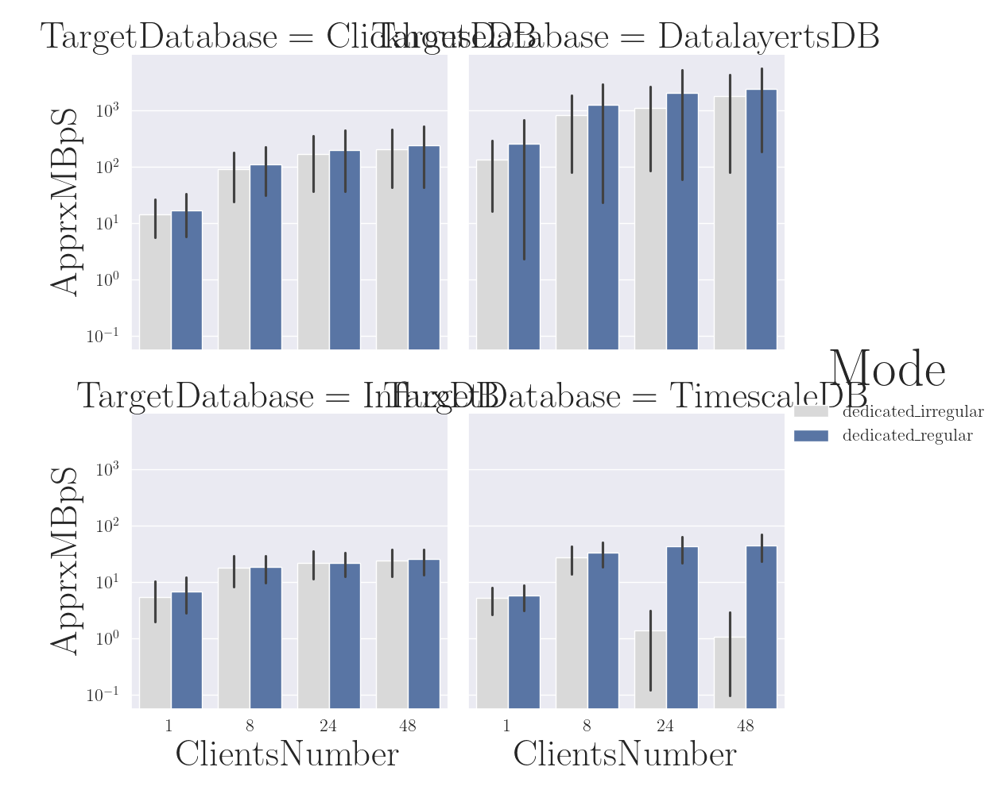

In [ ]:

plt.gca()
plt.axis([None, None, 0, regularity_ingestion_results.ApprxMBpS.max()])

print("first violin plot for each ClientsNumber per Database, then Bachsize per Database. After each graph a table with the mean values")

# ClientsNumber
# plt.figure("CN")
# plt.title("Comparison: Regular vs Irregular Data Transmission based on Number of Concurrent Clients")

sns.catplot(data=regularity_ingestion_results, kind='bar', x="ClientsNumber", y="ApprxMBpS", hue="Mode",
            col="TargetDatabase", col_wrap=2, palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
plt.yscale('log')
plt.savefig(path+'regularityCN-bar.svg', format='svg')
plt.show()
plt.close()


# # agg_regularityCN
# show_and_print(pd.DataFrame(data=regularity_ingestion_results.groupby(
#     ['TargetDatabase', 'Mode', 'ClientsNumber'], as_index=False).agg({"ApprxMBpS": 'mean'})), 'reg_CN', './graphs/')

# print("Considering CLientLatency")

# sns.catplot(data=regularity_ingestion_results, kind='bar', x="ClientsNumber", y="ApprxMBpS_with_Client", hue="Mode",
#             col="TargetDatabase", col_wrap=3, palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
# plt.yscale('log')
# plt.savefig(path+'regularityCN_Client.svg', format='svg')
# plt.show()
# plt.close()

# show_and_print(pd.DataFrame(data=regularity_ingestion_results.groupby(
#     ['TargetDatabase', 'Mode', 'ClientsNumber'], as_index=False).agg({"ApprxMBpS_with_Client": 'mean'})), 'reg_CN_Client', './graphs/')

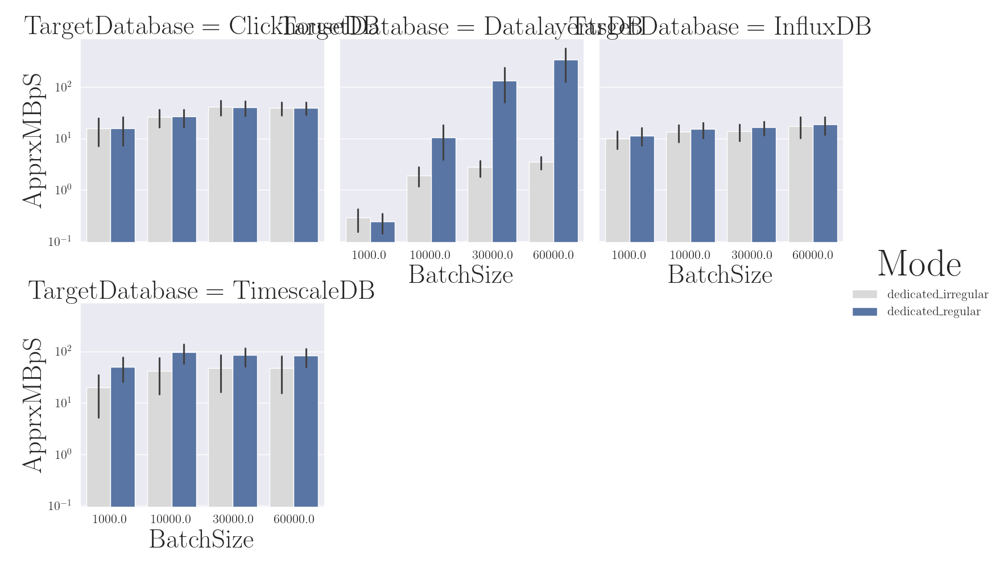

In [ ]:


#  Batchsize
# plt.figure("BS")
# plt.title("Comparison: Regular vs Irregular Data Transmission based on Size of Batches")
sns.catplot(data=regularity_ingestion_results, kind='bar', x="BatchSize", y="ApprxMBpS", hue="Mode",
            col="TargetDatabase", col_wrap=3, palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
plt.yscale('log')
plt.savefig(path+'regularityBS-bar.svg', format='svg')
plt.show()
plt.close()


# agg_regularityBS
show_and_print(pd.DataFrame(data=regularity_ingestion_results.groupby(
    ['TargetDatabase', 'Mode', 'BatchSize'], as_index=False).agg({"ApprxMBpS": 'mean'})), 'reg_BS', './graphs/')


# print("Considering CLientLatency")


# sns.catplot(data=regularity_ingestion_results, kind='bar', x="BatchSize", y="ApprxMBpS_with_Client", hue="Mode",
#             col="TargetDatabase", col_wrap=3, palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
# plt.yscale('log')
# plt.savefig(path+'regularityBS_Client.svg', format='svg')
# plt.show()
# plt.close()


# # agg_regularityBS
# show_and_print(pd.DataFrame(data=regularity_ingestion_results.groupby(
#     ['TargetDatabase', 'Mode', 'BatchSize'], as_index=False).agg({"ApprxMBpS_with_Client": 'mean'})), 'reg_BS_Client', './graphs/')

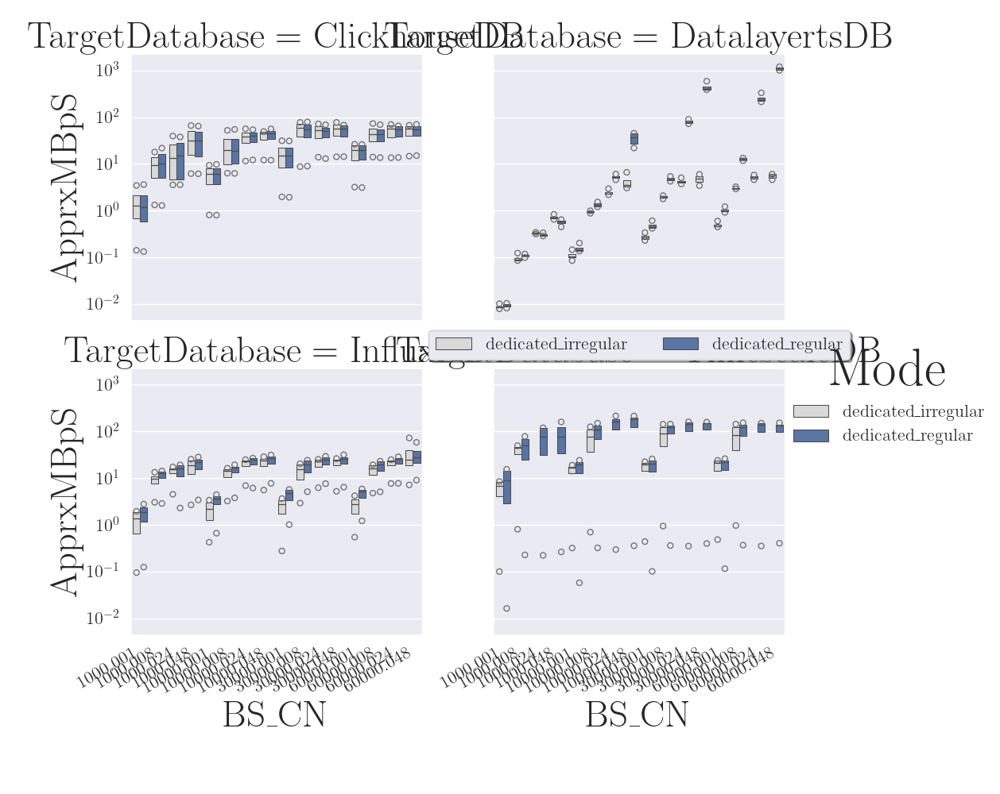

In [ ]:
#USED


sns.catplot(data=regularity_ingestion_results, kind='boxen', x="BS_CN", y="ApprxMBpS", hue="Mode",
            col="TargetDatabase", col_wrap=2, palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
plt.gcf().autofmt_xdate()
plt.yscale('log')
plt.savefig(path+'!regularityBS-CN-boxen.svg', format='svg')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
plt.show()
plt.close()


# agg_regularityBS
show_and_print(pd.DataFrame(data=regularity_ingestion_results.groupby(
    ['TargetDatabase', 'Mode', 'BatchSize', 'ClientsNumber'], as_index=False).agg({"ApprxMBpS": 'mean'})), 'reg_BS_CN', './graphs/')



TOP RATES and their resp. CLientsNumbers and Batchsizes


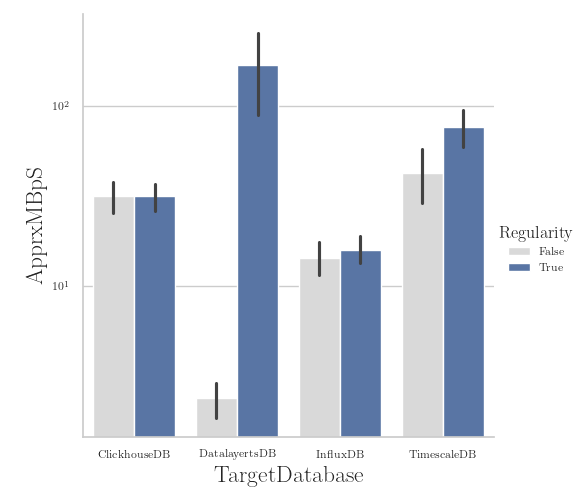

In [ ]:


#  TOP Values

print("TOP RATES and their resp. CLientsNumbers and Batchsizes")
show_and_print(pd.DataFrame(data=top_rates_Ded_Ing), 'reg_TOP', './graphs/')


# plt.figure("TOP")
# plt.title("Comparison: Regular vs Irregular Data Transmission based on TOP Ingestion Rates across BS,CN,Dim parameters.")
sns.catplot(data=top_rates_Ded_Ing, kind='bar', x="TargetDatabase",
            y="ApprxMBpS", hue="Regularity", palette={True: "b", False: ".85"})
plt.yscale('log')
plt.savefig(path+'regularityTOP_withCons-bar.svg', format='svg')
plt.show()
plt.close()



# print("Considering CLientLatency")



# # plt.figure("TOP")
# # plt.title("Comparison: Regular vs Irregular Data Transmission based on TOP Ingestion Rates across BS,CN,Dim parameters.")
# sns.catplot(data=top_rates_Client[top_rates_Client['Mode'].str.contains('dedicated_')], kind='bar', x="TargetDatabase",
#             y="ApprxMBpS_with_Client", hue="Mode", palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
# plt.yscale('linear')
# plt.savefig(path+'regularityTOP_Client.svg', format='svg')
# plt.show()
# plt.close()





# show_and_print(pd.DataFrame(data=top_rates_Client[top_rates_Client['Mode'].str.contains(
#     'dedicated_')]), 'reg_TOP_Cl', './graphs/')

TOP RATES and their resp. CLientsNumbers and Batchsizes


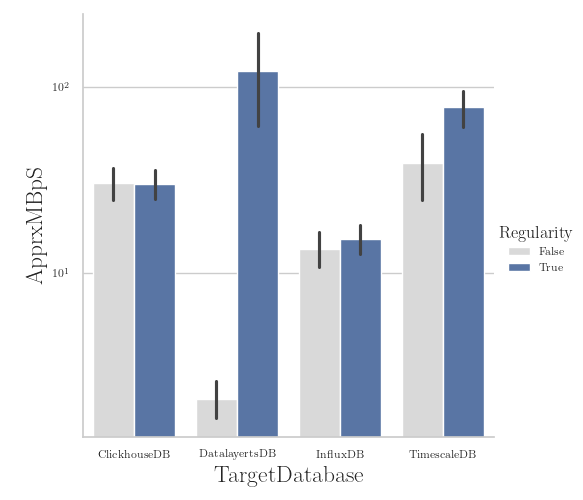

In [ ]:
#USED

#  TOP Values

print("TOP RATES and their resp. CLientsNumbers and Batchsizes")
show_and_print(pd.DataFrame(data=top_rates_Ded_Ing), 'reg_TOP', './graphs/')


# plt.figure("TOP")
# plt.title("Comparison: Regular vs Irregular Data Transmission based on TOP Ingestion Rates across BS,CN,Dim parameters.")
sns.catplot(data=top_rates_Ded_Patch_Ing, kind='bar', x="TargetDatabase",
            y="ApprxMBpS", hue="Regularity", palette={True: "b", False: ".85"})
plt.yscale('log')
plt.savefig(path+'!regularityTOP_JustPatchW-bar.svg', format='svg')
plt.show()
plt.close()



# print("Considering CLientLatency")



# # plt.figure("TOP")
# # plt.title("Comparison: Regular vs Irregular Data Transmission based on TOP Ingestion Rates across BS,CN,Dim parameters.")
# sns.catplot(data=top_sample_Client[top_sample_Client['Mode'].str.contains('dedicated_')], kind='bar', x="TargetDatabase",
#             y="ApprxMBpS_with_Client", hue="Mode", palette={"dedicated_regular": "b", "dedicated_irregular": ".85"})
# plt.yscale('log')
# plt.savefig(path+'regularityTOP-sample_Client.svg', format='svg')
# plt.show()
# plt.close()





# show_and_print(pd.DataFrame(data=top_sample_Client[top_sample_Client['Mode'].str.contains(
#     'dedicated_')]), 'reg_TOP-sample_Cl', './graphs/')

## Consecutive Ingestion vs Patchwork Ingestion
### ( all parralel Clients send 1 min. batches containing all sensor data and timestamps of all batches are seemlessly attached to another - vs - Clients Send Batches where sensorsdata is distributed across clients and each bach starts the series in another point in time. )



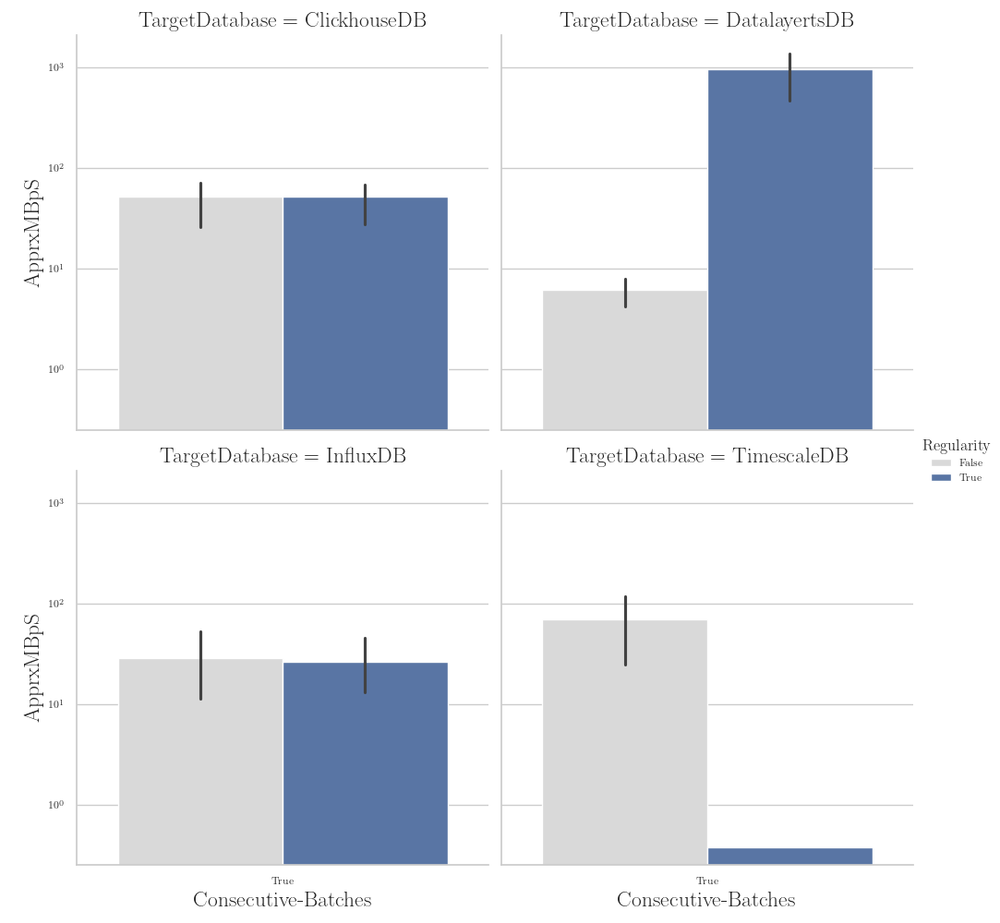

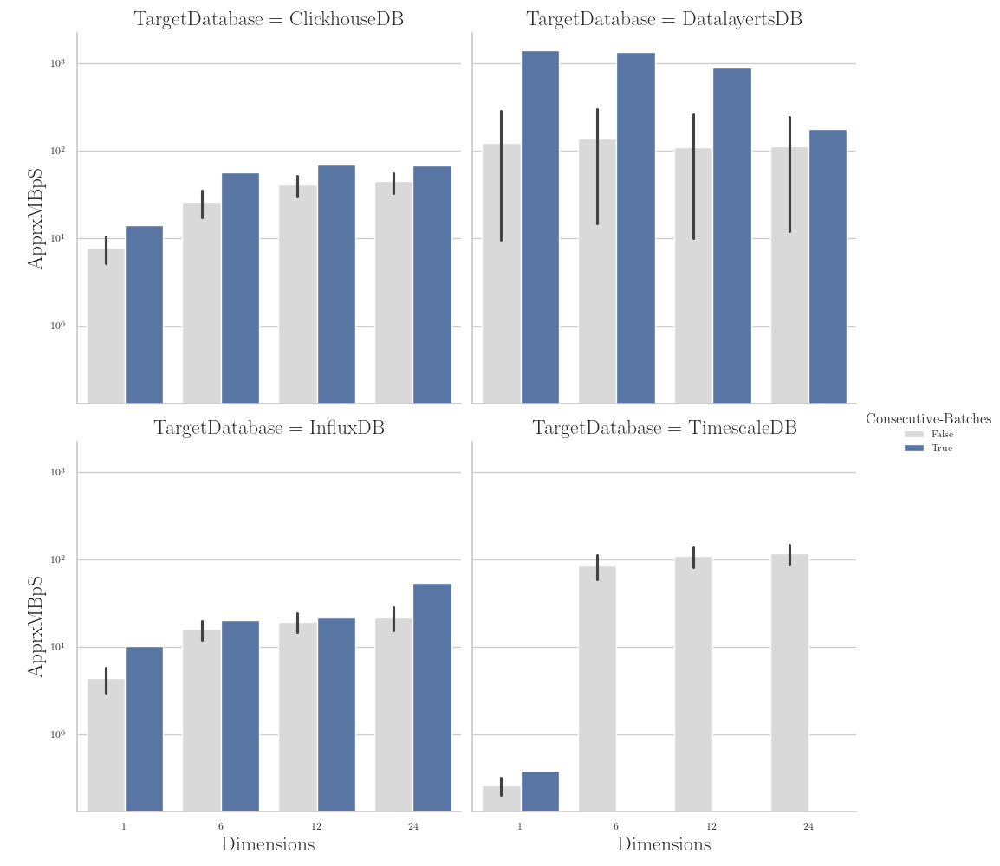

In [ ]:


sns.catplot(data=top_rates_Ded_Cons_Ing, kind='bar', x="Consecutive-Batches", y="ApprxMBpS", hue="Regularity",
            col="TargetDatabase", col_wrap=3, palette={True: "b", False: ".85"})
# plt.gcf().autofmt_xdate()
plt.yscale('log')
plt.savefig(path+'Consecutive(60kBS-48C)-Reg-box.svg', format='svg')
plt.show()
plt.close()

#USED
sns.catplot(data=top_rates_Ded_Reg_Ing, kind='bar', x="Dimensions", y="ApprxMBpS", hue="Consecutive-Batches",
            col="TargetDatabase", col_wrap=2, palette={True: "b", False: ".85"})
# plt.gcf().autofmt_xdate()
plt.yscale('log')
plt.savefig(path+'!Consecutive(60kBS-48C)-top-Reg-bar.svg', format='svg')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)

plt.show()
plt.close()

### Multi Dim


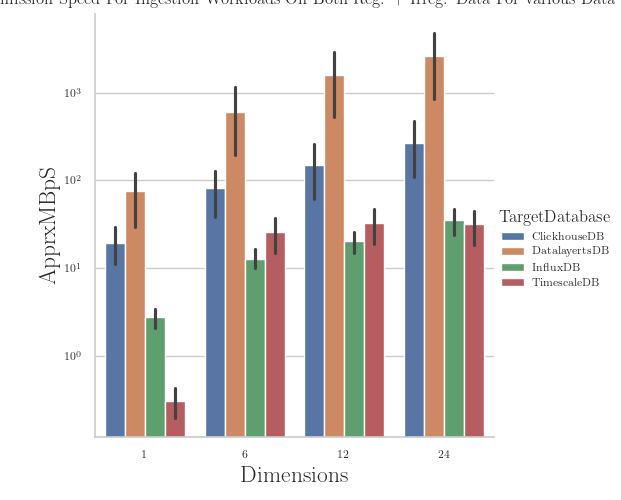

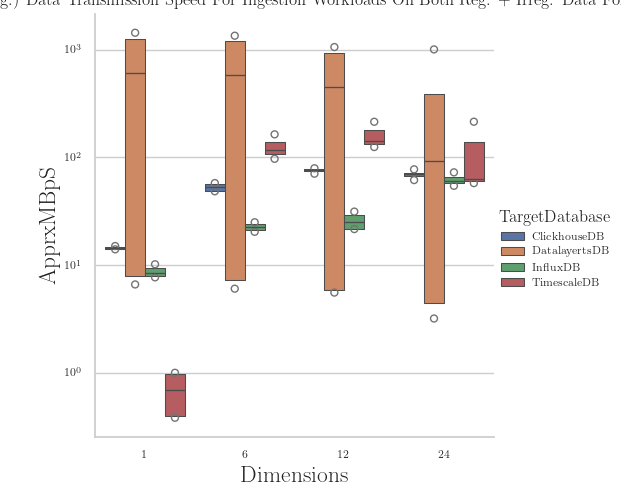

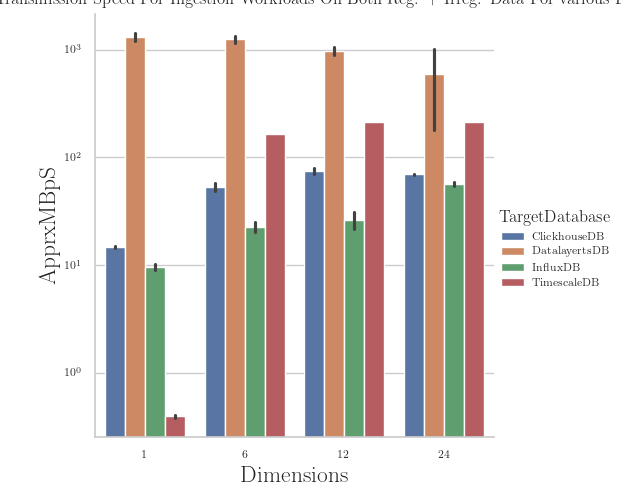

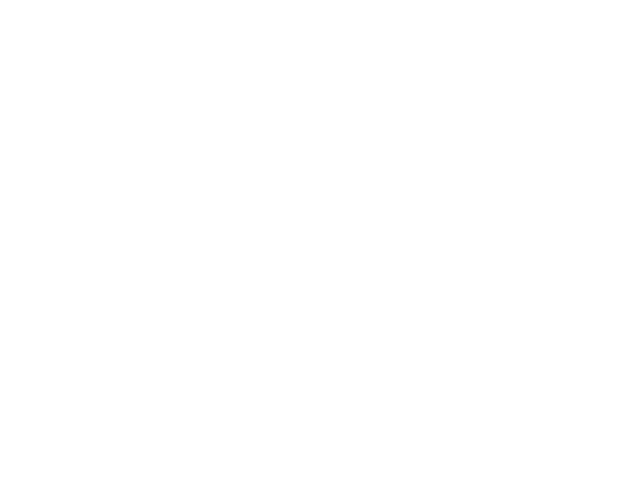

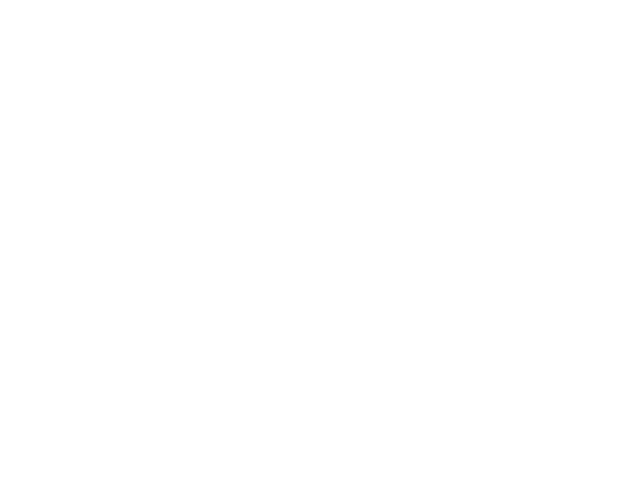

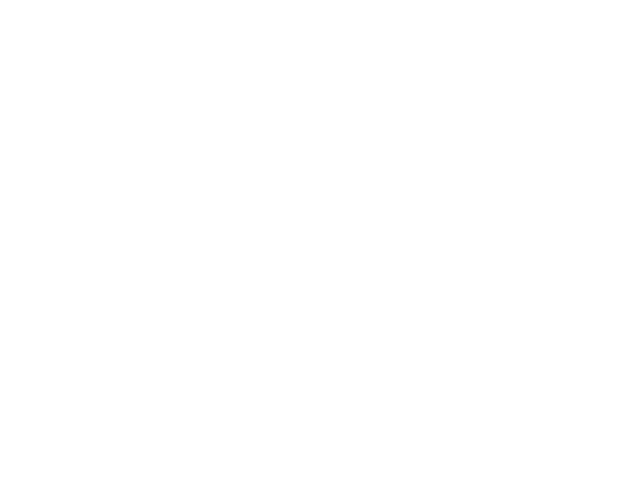

In [ ]:


multidimIng_TOP_all = top_rates_Ded_Ing.groupby(['TargetDatabase', 'Mode', 'Operation', 'Dimensions'], as_index=False)[
    'ApprxMBpS'].max()

# TODO lineplot with variance  , 99% quantil . 1 % quantil or min and max ,, like a mix between barplot and lineplots

plt.figure("multidim-bar")
sns.catplot(data=regularity_ingestion_results, kind="bar", x="Dimensions",
            y="ApprxMBpS",   hue="TargetDatabase")
plt.yscale('log')
plt.title("Avg Data Transmission Speed For Ingestion Workloads On Both Reg. + Irreg. Data For various Data Dimensions")
plt.savefig(path+'multidim-avg-IngP+W-bar.svg', format='svg')
plt.show()
plt.close()


plt.figure("multidimTOP-box")
sns.catplot(data=multidimIng_TOP_all, kind="boxen", x="Dimensions",
            y="ApprxMBpS",   hue="TargetDatabase")
plt.yscale('log')
plt.title("TOP (Optimal Ingestion Config.) Data Transmission Speed For Ingestion Workloads On Both Reg. + Irreg. Data For various Data Dimensions")
plt.savefig(path+'multidim-top-IngP+C-boxen.svg', format='svg')
plt.show()
plt.close()

#USED
plt.figure("multidimTOP-REG-bar")
sns.catplot(data=multidimIng_TOP_all.loc[multidimIng_TOP_all['Mode'].str.contains('_reg')], kind="bar", x="Dimensions",
            y="ApprxMBpS",   hue="TargetDatabase")
plt.yscale('log')
plt.title("TOP Regular Data Transmission Speed For Ingestion Workloads On Both Reg. + Irreg. Data For various Data Dimensions")
plt.savefig(path+'!multidim-top-reg-IngP+C-boxen.svg', format='svg')
plt.show()
plt.close()

# plt.figure("multidim-box-Client")
# sns.catplot(data=multidimIng_TOP_all, kind="bar", x="Dimensions",
#             y="ApprxMBpS_with_Client",   hue="TargetDatabase")
# plt.yscale('log')
# plt.title("TOP (Optimal Ingestion Config.) Data Transmission Speed For Ingestion WorDatalayerkloads On Both Reg. + Irreg. Data For various Data Dimensions")
# plt.savefig(path+'multidim-I-BP_Client.svg', format='svg')
# plt.show()
# plt.close()

##  Ing System Metrics


### regurlar vs irregular transaction system usage 


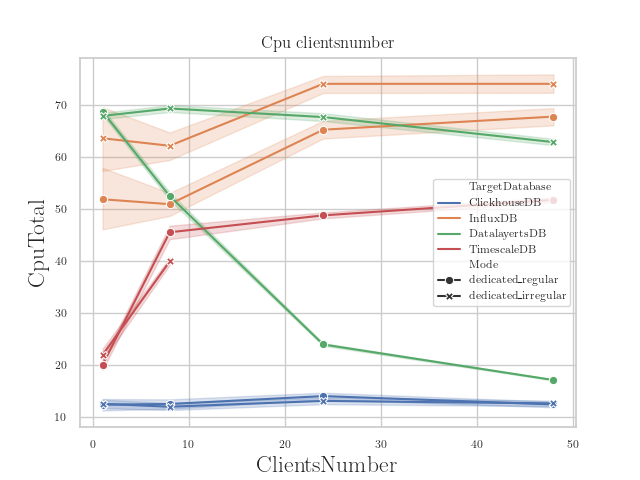

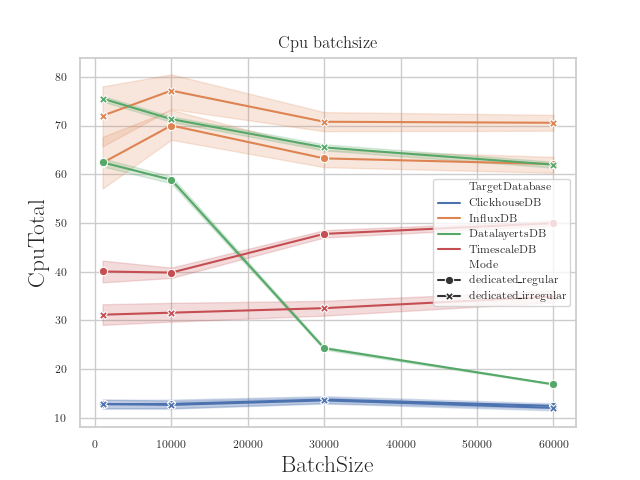

In [ ]:


#USED

plt.figure("Cpu-Cn")
plt.title("Cpu clientsnumber")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="ClientsNumber", y="CpuTotal",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'!cpu-cn.svg', format='svg')
plt.show()
plt.close()
#USED

plt.figure("Cpu-Bs")
plt.title("Cpu batchsize")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="BatchSize", y="CpuTotal",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'!Cpu-Bs.svg', format='svg')
plt.show()
plt.close()

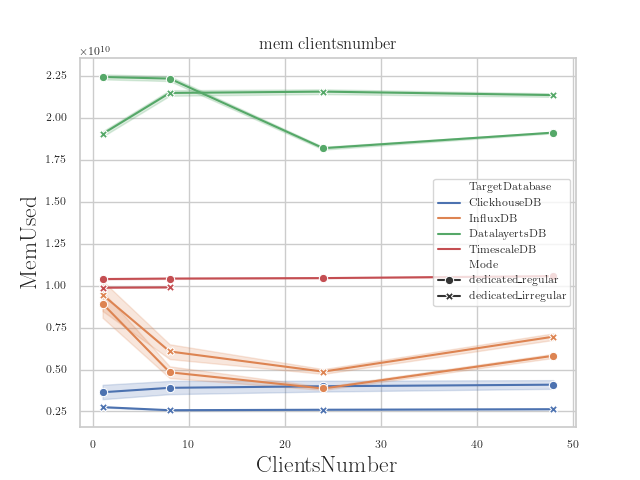

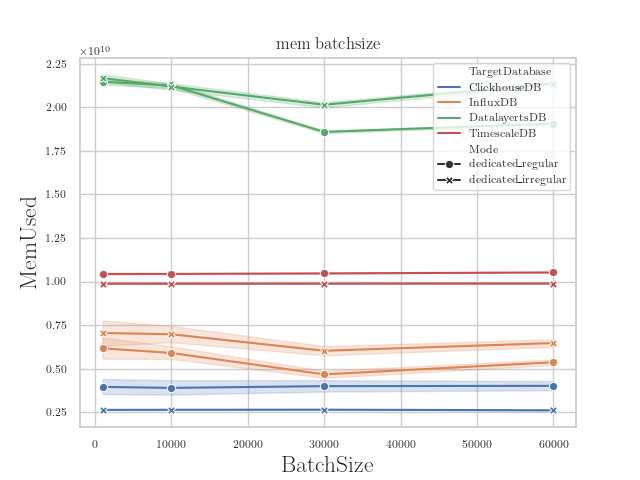

In [ ]:


###


plt.figure("Mem-Cn")
plt.title("mem clientsnumber")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="ClientsNumber", y="MemUsed",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'mem-cn.svg', format='svg')
plt.show()
plt.close()


plt.figure("Mem-Bs")
plt.title("mem batchsize")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="BatchSize", y="MemUsed",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'mem-Bs.svg', format='svg')
plt.show()
plt.close()

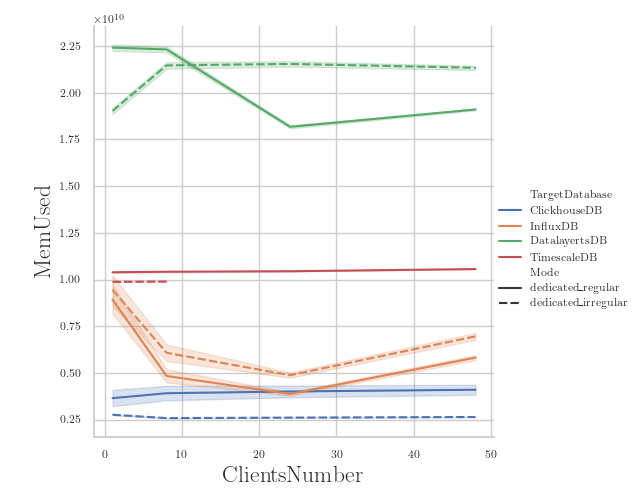

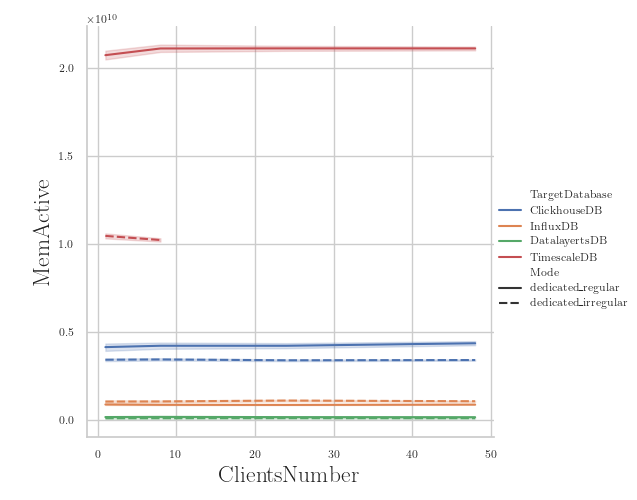

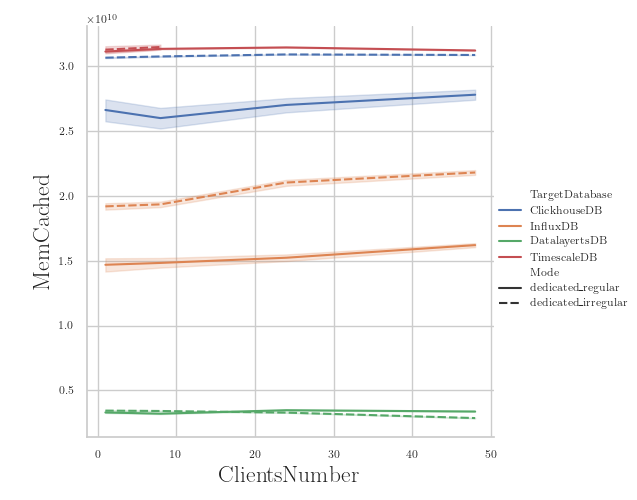

In [ ]:


###

# plt.figure("used mem ")
# plt.title("mem used")

#USED
sns.relplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], kind="line", x="ClientsNumber",
            y="MemUsed", hue="TargetDatabase", style="Mode")
plt.savefig(path+'!mem-used.svg', format='svg')
plt.show()
plt.close()

# plt.figure("active mem ")
# plt.title("mem active")

sns.relplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], kind="line", x="ClientsNumber",
            y="MemActive", hue="TargetDatabase", style="Mode")
plt.savefig(path+'mem-active.svg', format='svg')
plt.show()
plt.close()

# plt.figure("cache mem ")
# plt.title("mem cache")

sns.relplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], kind="line", x="ClientsNumber",
            y="MemCached", hue="TargetDatabase", style="Mode")
plt.savefig(path+'mem-cache.svg', format='svg')
plt.show()
plt.close()


###

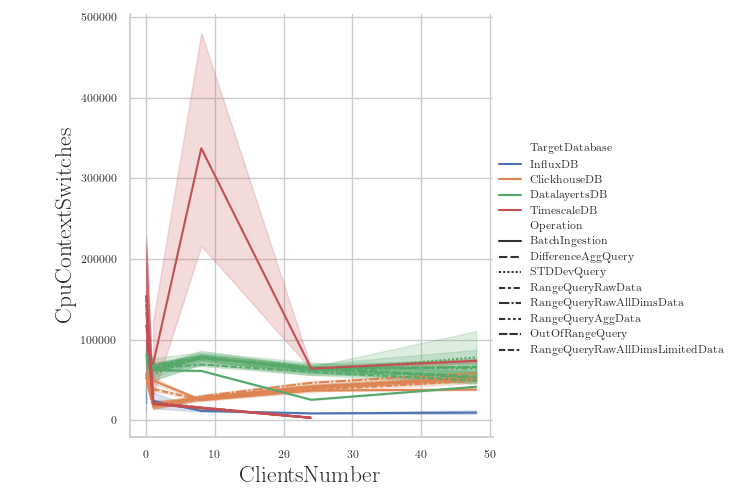

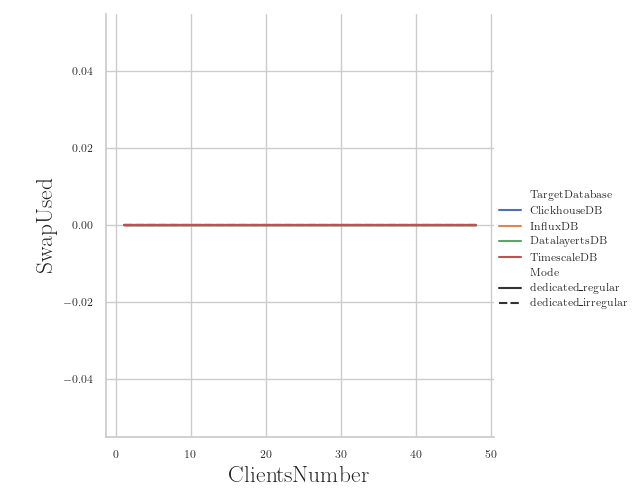

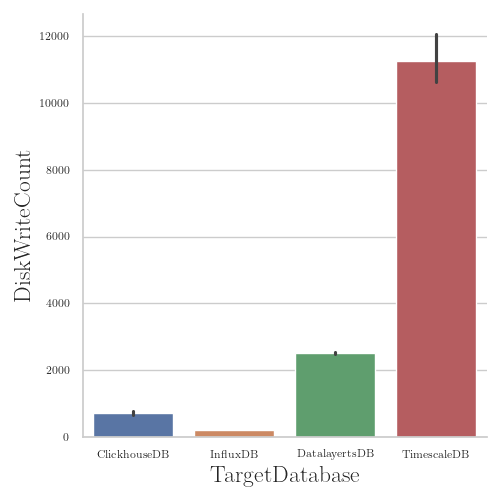

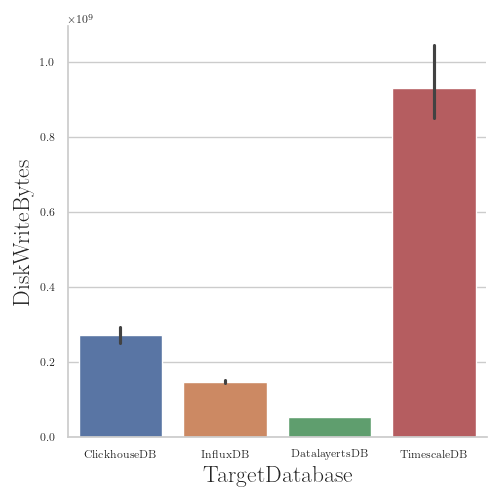

In [ ]:


# plt.figure("cpu context switches ")
# plt.title("cpu context switches")

sns.relplot(data=systemmetrics, kind="line", x="ClientsNumber",
            y="CpuContextSwitches", hue="TargetDatabase", style="Operation")
plt.savefig(path+'cpu-context-switches.svg', format='svg')
plt.show()
plt.close()


# plt.figure("swap ")
# plt.title("swap")

sns.relplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], kind="line", x="ClientsNumber",
            y="SwapUsed", hue="TargetDatabase", style="Mode")
plt.savefig(path+'swap.svg', format='svg')
plt.show()
plt.close()

####


# plt.figure("Ingestion Disk WriteCOunt ")
sns.catplot(data=systemmetricsDED[systemmetricsDED['Operation'].str.contains(
    "Batch")], kind="bar", x='TargetDatabase', y="DiskWriteCount", hue="TargetDatabase")

plt.savefig(path+'IngWriteCount.svg', format='svg')
plt.show()
plt.close()


# plt.figure("Ingestion Disk Write Bytes ")
sns.catplot(data=systemmetricsDED[systemmetricsDED['Operation'].str.contains(
    "Batch")], kind="bar", x='TargetDatabase', y="DiskWriteBytes", hue="TargetDatabase")

plt.savefig(path+'IngWriteBytes.svg', format='svg')
plt.show()
plt.close()

### multiDim transaction system usage

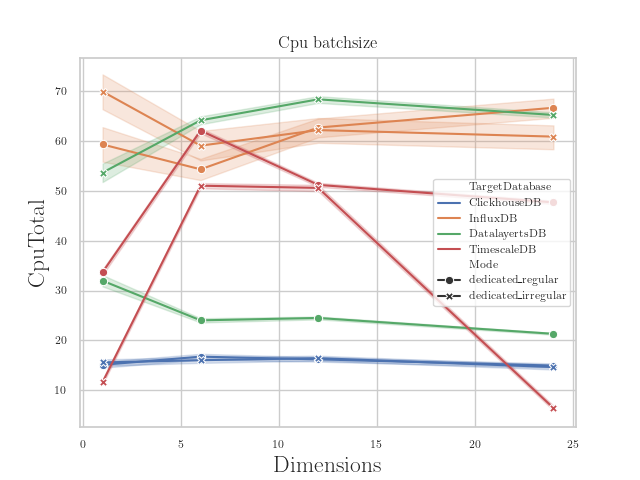

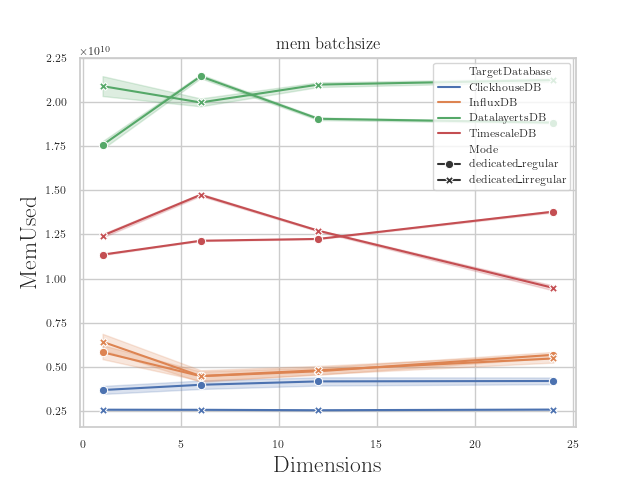

In [ ]:
# TODO: TAKE TOTAL: MEMCACHED + MEM-USERSPACE
#USED
plt.figure("Cpu-Dim")
 
sns.lineplot(data=systemmetricsDED, x="Dimensions", y="CpuTotal",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'!Cpu-Dim.svg', format='svg')
plt.show()
plt.close()

#USED
plt.figure("mem-Dim")
 
sns.lineplot(data=systemmetricsDED, x="Dimensions", y="MemUsed",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'!mem-Dim.svg', format='svg')
plt.show()
plt.close()

### Network Usage

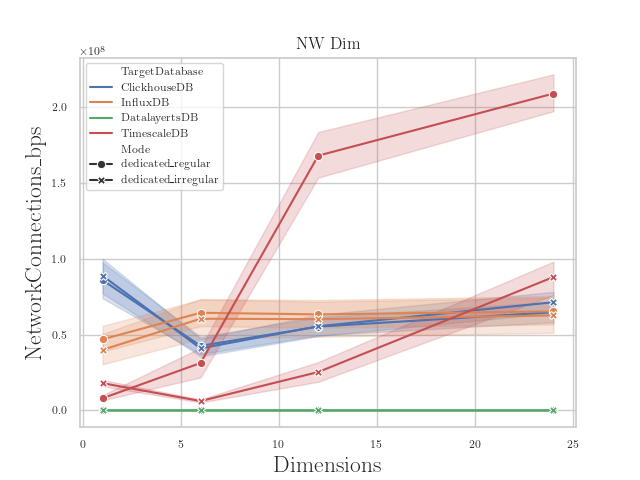

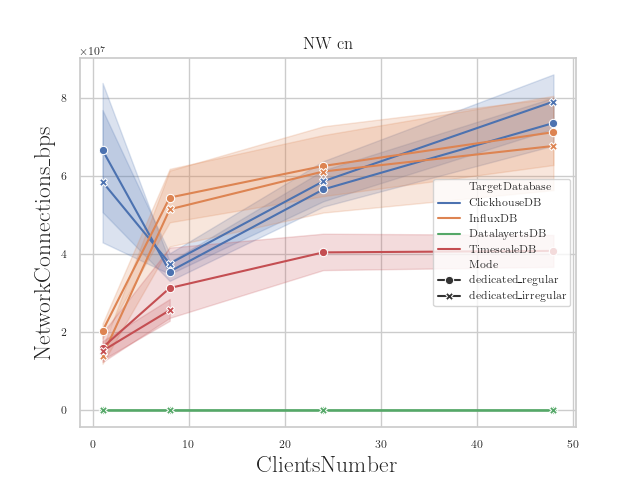

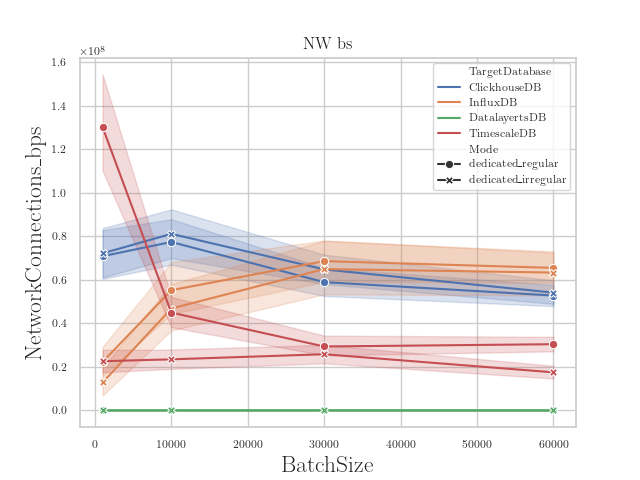

In [ ]:
# Todo
# Compare Compression Policys


plt.figure("NW-Dim")
plt.title("NW Dim")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="Dimensions", y="NetworkConnections_bps",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'NW-Dim.svg', format='svg')
plt.show()
plt.close()

plt.figure("NW-cn")
plt.title("NW cn")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="ClientsNumber", y="NetworkConnections_bps",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'NW-cn.svg', format='svg')
plt.show()
plt.close()
plt.figure("NW-bs")
plt.title("NW bs")

sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="BatchSize", y="NetworkConnections_bps",
             hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.savefig(path+'NW-bs.svg', format='svg')
plt.show()
plt.close()


# Network vs DiskIO

# plt.figure("NW-IO")
# plt.title("NW -IO")

# sns.lineplot(data=systemmetricsDED.loc[systemmetricsDED["Operation"].str.contains("Ing")], x="DiskWriteBytes", y="NetworkConnections_bps",
#              hue="TargetDatabase", style="Mode", markers=True, dashes=False)
# plt.xscale("log")
# plt.yscale("log")
# plt.savefig(path+'NW-IO.svg', format='svg')
# plt.show()
# plt.close()
# Network vs CPU

# plt.figure("NW-CPU")
# plt.title("NW CPU")

# sns.lineplot(data=systemmetricsDED, x="CpuTotal", y="NetworkConnections_bps_bps",
#              hue="TargetDatabase", style="Mode", markers=True, dashes=False)
# plt.savefig(path+'NW-CPU.svg', format='svg')
# plt.show()
# plt.close()

In [ ]:
# plt.figure("NW-CPU")
# plt.title("NW CPU")

# sns.catplot(data=systemmetricsDED,kind="point", x="NetworkConnections_bps_bps", y="CpuTotal",
#              hue="TargetDatabase")
# plt.savefig(path+'NW-CPU.svg', format='svg')
# plt.show()
# plt.close()

### Filesystem VS CPU on Time

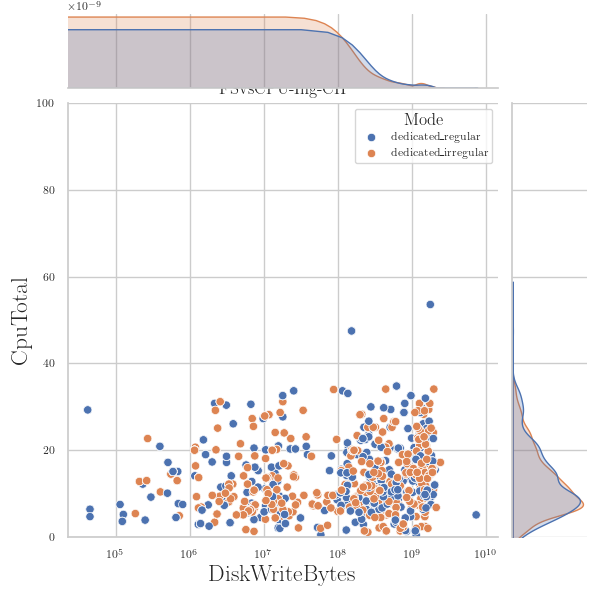

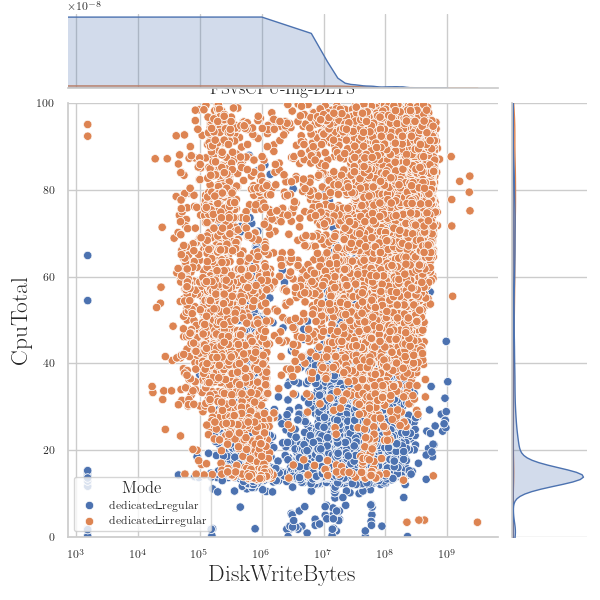

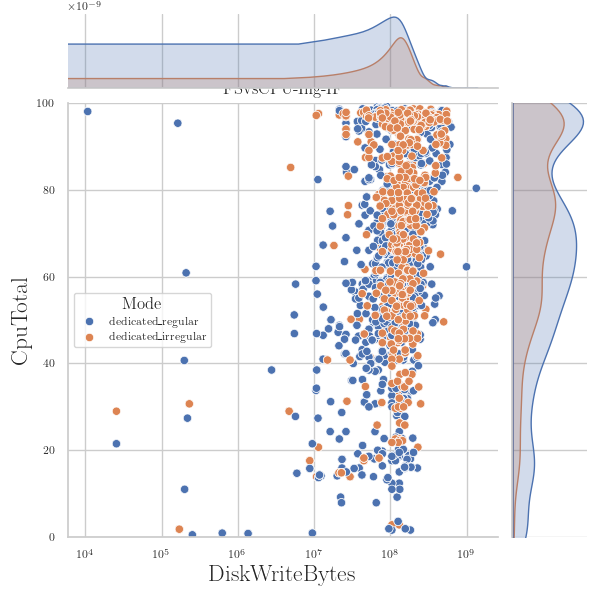

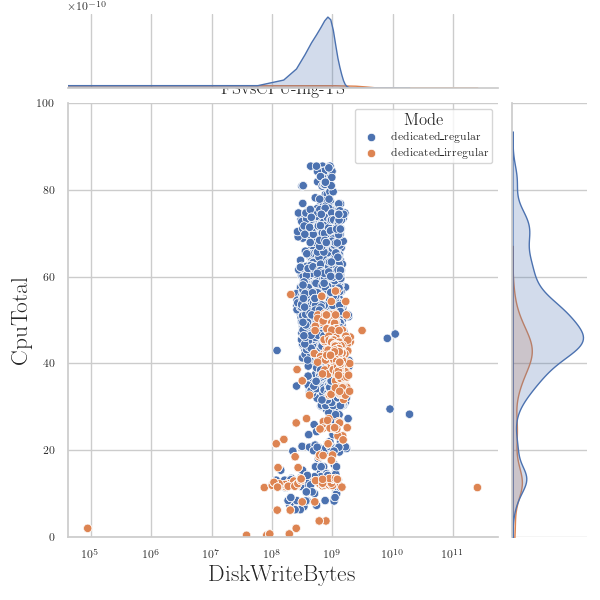

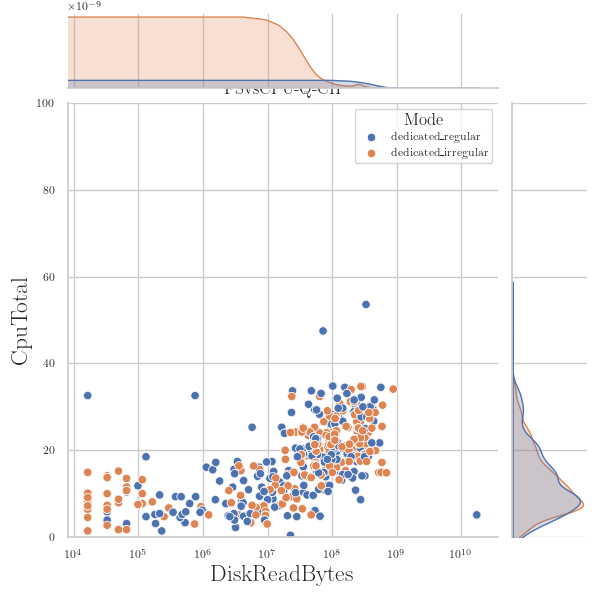

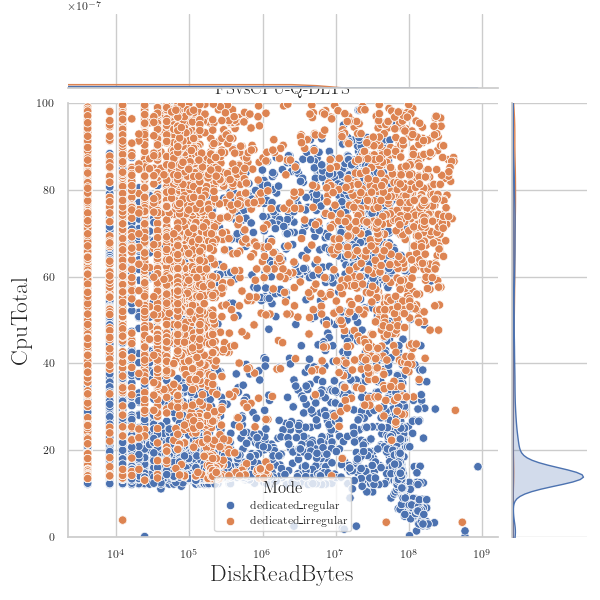

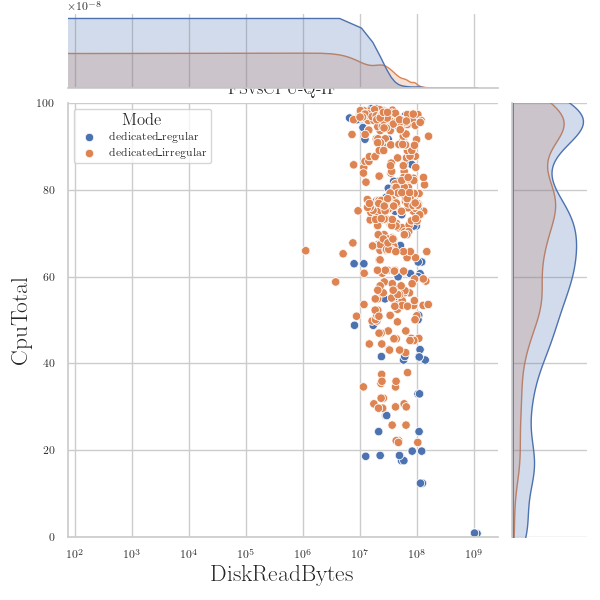

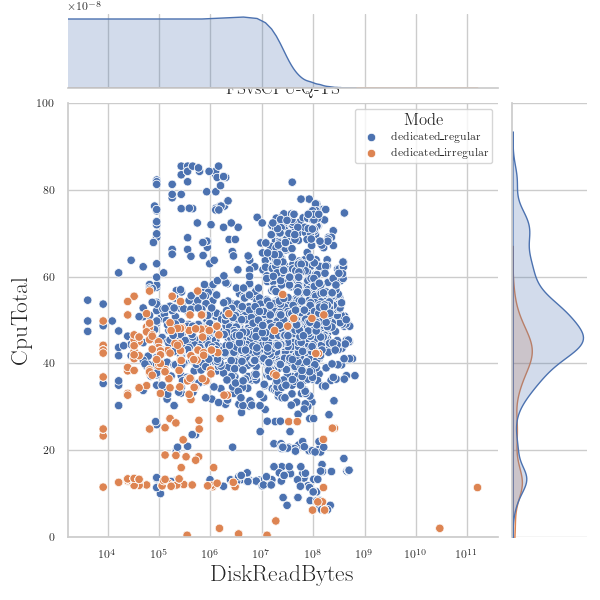

In [ ]:
systemmetricsDED = systemmetricsDED.assign(DiskIoBytes=lambda x: x.DiskReadBytes +
                                           x.DiskWriteBytes).assign(TargetDatabaseModes=lambda x: x.TargetDatabase+", "+x.Mode)
sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Clickhouse"))], x="DiskWriteBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Ing-CH")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Ing-CH.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Datalayer"))], x="DiskWriteBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Ing-DLTS")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Ing-DLTS.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Influx"))], x="DiskWriteBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Ing-IF")

plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Ing-IF.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Timescale"))], x="DiskWriteBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Ing-TS")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Inf-TS.svg', format='svg')
plt.show()
plt.close()
#  query

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Clickhouse"))], x="DiskReadBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Q-CH")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Q-CH.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Datalayer"))], x="DiskReadBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Q-DLTS")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Q-DLTS.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Influx"))], x="DiskReadBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Q-IF")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-Q-IF.svg', format='svg')
plt.show()
plt.close()

sns.jointplot(systemmetricsDED.loc[(systemmetricsDED["Operation"].str.contains("Ing")) & (
    systemmetricsDED["TargetDatabase"].str.contains("Timescale"))], x="DiskReadBytes", y="CpuTotal", hue="Mode")
plt.title("FSvsCPU-Q-TS")
plt.xscale('log')
plt.ylim(0, 100)
plt.savefig(path+'FSvsCPU-q-TS.svg', format='svg')
plt.show()
plt.close()

## Combined Metrics

In [ ]:
Combinded  = pd.merge(systemmetrics_rates, results_rates, how="outer", on=['TargetDatabase', 'Mode', 'Operation', 'ClientsNumber', 'BatchSize', 'Dimensions']).assign(TargetDatabaseModes=lambda x: x.TargetDatabase+", "+x.Mode)

Combinded= Combinded.assign(NetworkCompressionQuotient=lambda x: x.NetworkConnections_bps*0.001*0.001/x.ApprxMBpS*8)
Combinded= Combinded.assign(NetworkCompressionQuotient_Client=lambda x: x.NetworkConnections_bps*0.001*0.001/x.ApprxMBpS_with_Client*8)

Combinded_ingestion = Combinded.loc[Combinded.Operation.str.contains("Ingest")]
 

### Ingestion CPU vs Bandwidth


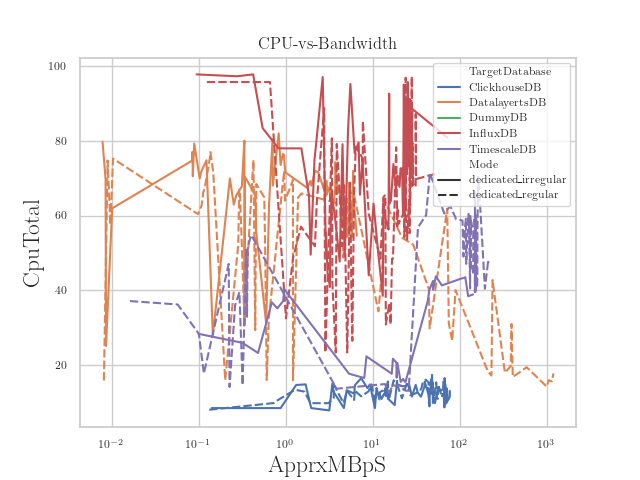

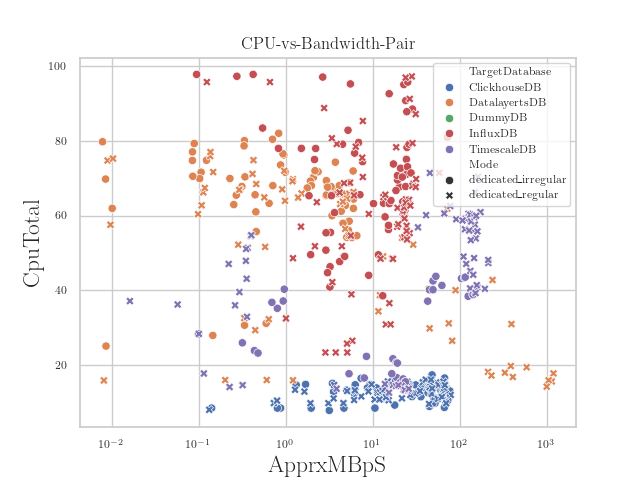

In [ ]:



plt.figure("CPU-vs-Bandwidth")
plt.title("CPU-vs-Bandwidth")
sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="CpuTotal", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.savefig(path+'CPU-vs-Bandwidth.svg', format='svg')
plt.show()
plt.close()


# plt.figure("CPU-vs-Bandwidth_Client")
# plt.title("CPU-vs-Bandwidth_Client")
# sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
#     "dedicated_")], x="ApprxMBpS_with_Client", y="CpuTotal", hue="TargetDatabase", style="Mode")
# plt.xscale("log")
# plt.savefig(path+'CPU-vs-Bandwidth_Client.svg', format='svg')
# plt.show()
# plt.close()

plt.figure("CPU-vs-Bandwidth-Pair")
plt.title("CPU-vs-Bandwidth-Pair")
sns.scatterplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="CpuTotal", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.savefig(path+'CPU-vs-Bandwidth_Pair.svg', format='svg')
plt.show()
plt.close()




# plt.figure("CPU-vs-Bandwidth")
# plt.title("CPU-vs-Bandwidth")
# sns.catplot(Combinded_ingestion ,kind="point",x = "CpuTotal" ,y = "ApprxMBpS" , hue="TargetDatabaseModes", col="Operation")
# plt.yscale("log")
# plt.savefig(path+'CPU-vs-Bandwidth.svg', format='svg')
# plt.show()
# plt.close()

### Ingestion IO vs Bandwidth

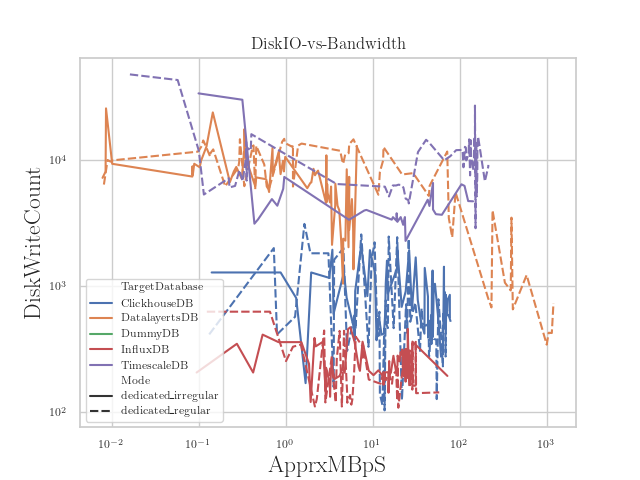

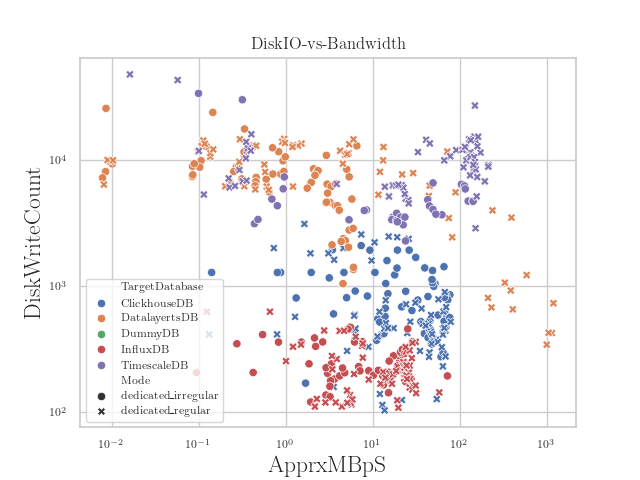

In [ ]:
plt.figure("DiskIO-vs-Bandwidth")
plt.title("DiskIO-vs-Bandwidth")
sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="DiskWriteCount", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")
plt.savefig(path+'DiskIO-vs-Bandwidth.svg', format='svg')
plt.show()
plt.close()

plt.figure("DiskIO-vs-Bandwidth")
plt.title("DiskIO-vs-Bandwidth")
sns.scatterplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="DiskWriteCount", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")
plt.savefig(path+'DiskIO-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()






# plt.figure("DiskIO-vs-Bandwidth_Client")
# plt.title("DiskIO-vs-Bandwidth_Client")
# sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
#     "dedicated_")], x="ApprxMBpS_with_Client", y="DiskWriteCount", hue="TargetDatabase", style="Mode")
# plt.xscale("log")
# plt.yscale("log")
# plt.savefig(path+'DiskIO-vs-Bandwidth_Client.svg', format='svg')
# plt.show()
# plt.close()

# Ingestion Network VS Bandwidth (Compression effectiveness) 

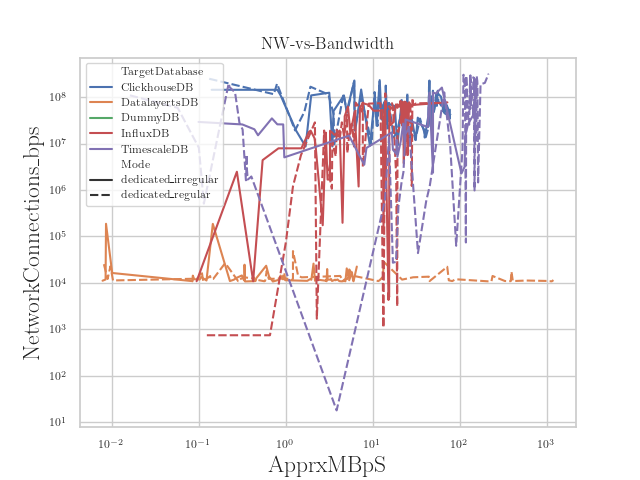

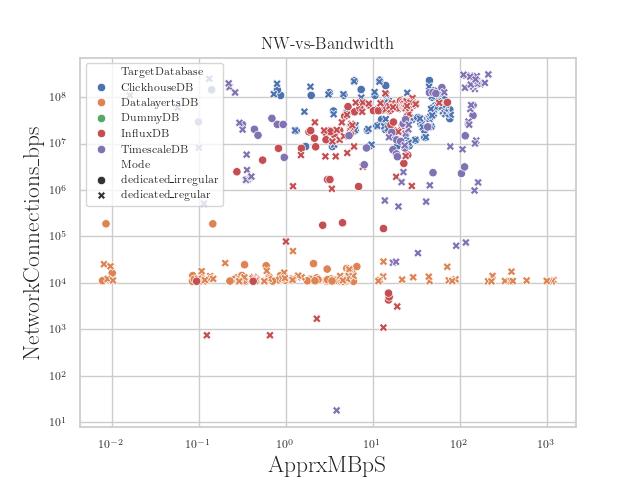

In [ ]:
plt.figure("NW-vs-Bandwidth")
plt.title("NW-vs-Bandwidth")
sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="NetworkConnections_bps", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'NW-vs-Bandwidth.svg', format='svg')
plt.show()
plt.close()

plt.figure("NW-vs-Bandwidth")
plt.title("NW-vs-Bandwidth")
sns.scatterplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="ApprxMBpS", y="NetworkConnections_bps", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'NW-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()



# plt.figure("NW-vs-Bandwidth_Client")
# plt.title("NW-vs-Bandwidth_Client")
# sns.lineplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
#     "dedicated_")], x="ApprxMBpS_with_Client", y="NetworkConnections_bps", hue="TargetDatabase", style="Mode")
# plt.xscale("log")
# plt.yscale("log")

# plt.savefig(path+'NW-vs-Bandwidth_Client.svg', format='svg')
# plt.show()
# plt.close()

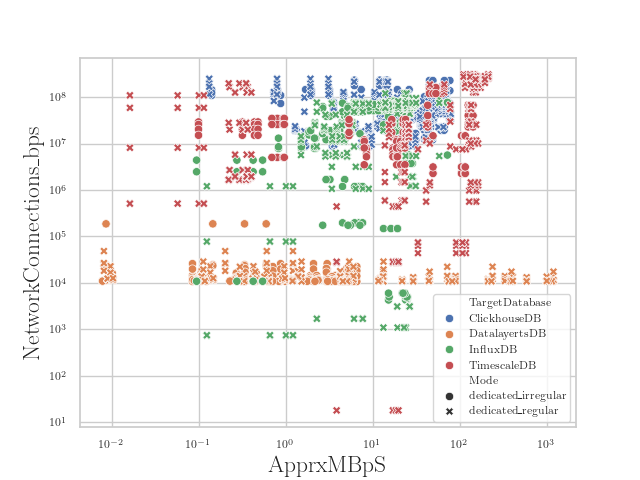

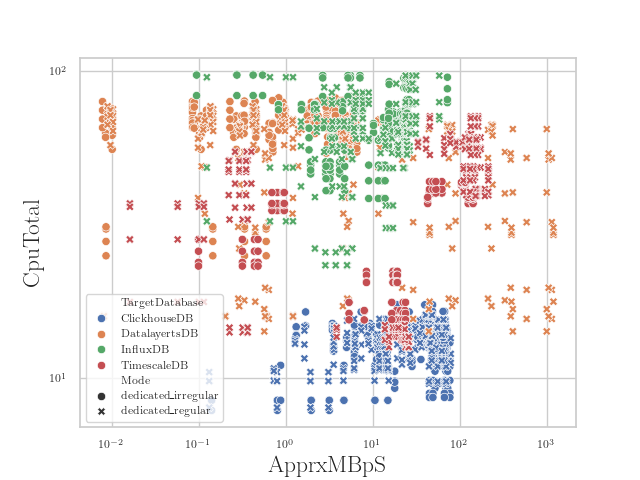

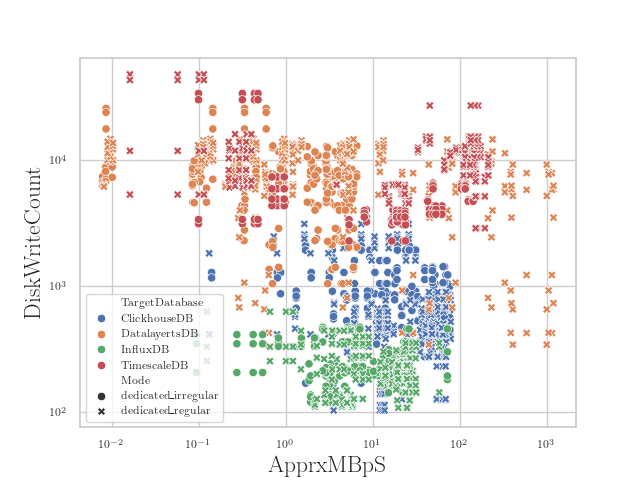

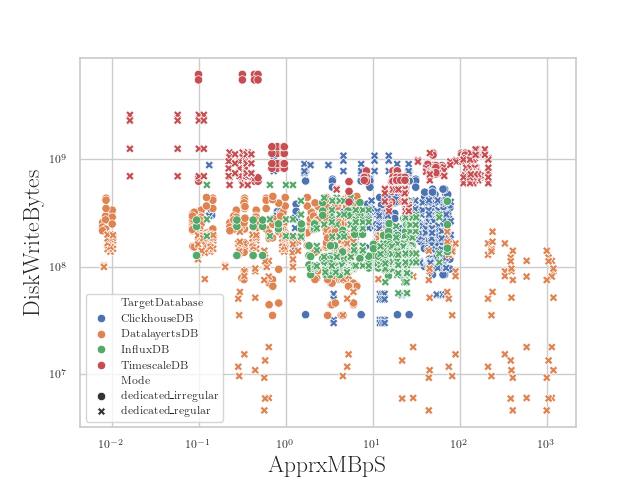

In [ ]:
# TODO TOP CONFIG scatter IO / cpu on BDWDt

top_combinded= systemmetrics_rates.loc[systemmetrics_rates.Mode.str.contains("ded")].merge(top_rates_Ded_Patch_Ing, how='inner', on=['TargetDatabase','Dimensions','ClientsNumber','Operation','Mode'])


plt.figure(" ")
plt.title(" ")
sns.scatterplot(top_combinded, x="ApprxMBpS", y="NetworkConnections_bps", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'TOP-NW-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()


plt.figure(" ")
plt.title(" ") 
sns.scatterplot(top_combinded, x="ApprxMBpS", y="CpuTotal", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'TOP-CPU-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()


plt.figure(" ")
plt.title(" ") 
sns.scatterplot(top_combinded, x="ApprxMBpS", y="DiskWriteCount", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'TOP-DiskWriteCount-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()



 
sns.scatterplot(top_combinded, x="ApprxMBpS", y="DiskWriteBytes", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.yscale("log")

plt.savefig(path+'TOP-DiskWriteBytes-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()


#  Ingestion Network vs CPU (Compression efficiency)

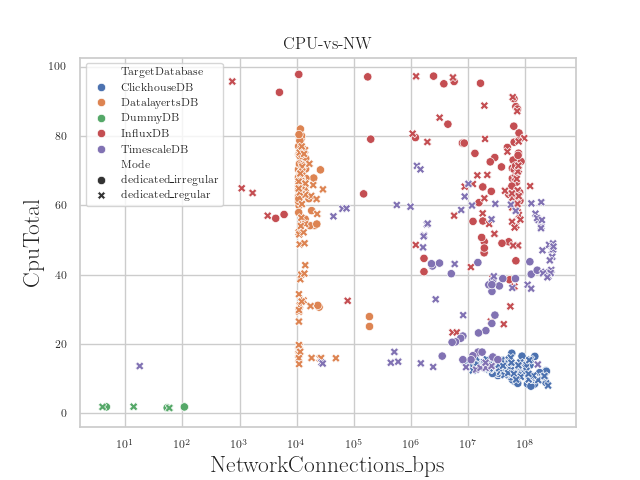

In [ ]:

plt.figure("CPU-vs-NW")
plt.title("CPU-vs-NW")
sns.scatterplot(Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], x="NetworkConnections_bps", y="CpuTotal", hue="TargetDatabase", style="Mode")
plt.xscale("log")
plt.savefig(path+'CPU-vs-NW.svg', format='svg')
plt.show()
plt.close()



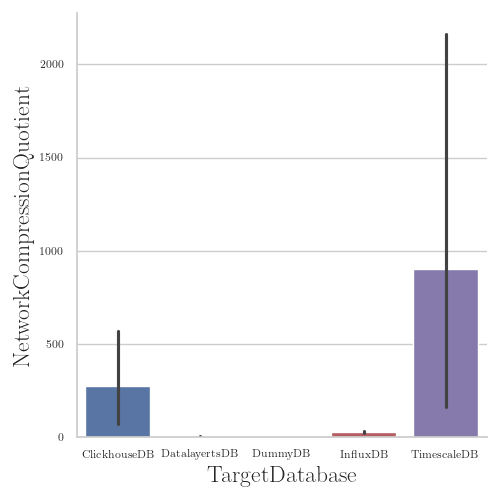

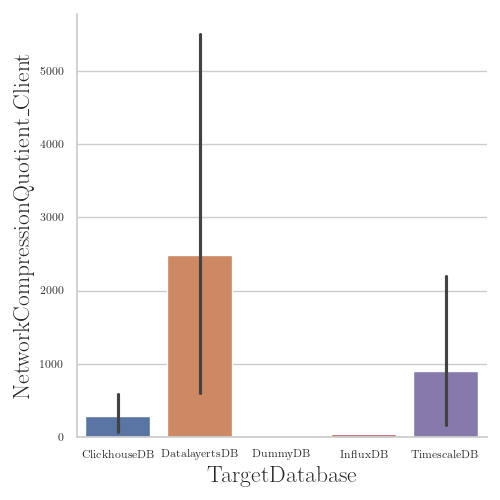

In [ ]:
plt.title("Compression Ratio by Transfered Byte in a Second - without Encoding Time (Client) ")
sns.catplot(data=Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], kind="bar", x='TargetDatabase', y="NetworkCompressionQuotient", hue="TargetDatabase")

plt.savefig(path+'IngWriteBytes.svg', format='svg')
plt.show()
plt.close()

plt.title("Compression Ratio by Transfered Byte in a Second - with  Encoding Time (Client) ")
sns.catplot(data=Combinded_ingestion.loc[Combinded_ingestion["Mode"].str.contains(
    "dedicated_")], kind="bar", x='TargetDatabase', y="NetworkCompressionQuotient_Client", hue="TargetDatabase")

plt.savefig(path+'IngWriteBytes.svg', format='svg')
plt.show()
plt.close()

DIMefficinecy


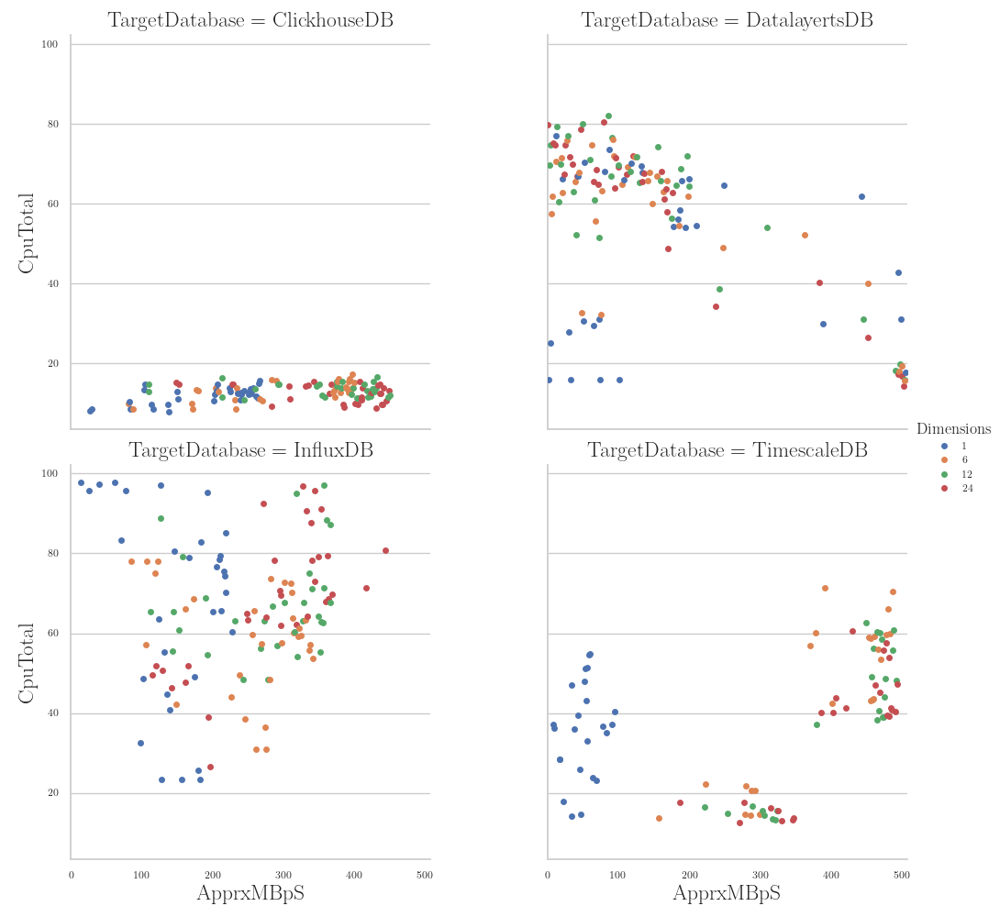

In [ ]:


print("DIMefficinecy")
plt.figure("Dim Efficiency")
plt.title("Efficiency of various data transmission cardinalities")
sns.catplot(Combinded_ingestion.loc[Combinded_ingestion.Mode.str.contains("ded")].loc[ Combinded_ingestion.TargetDatabase.str.contains("Dumm")==False ].merge(top_rates_Ded_Ing),kind="swarm",col="TargetDatabase",col_wrap=3, x="ApprxMBpS", y="CpuTotal", hue="Dimensions", palette="deep")
plt.xscale("linear")
plt.yscale("linear")
plt.savefig(path+'DIM-BANDWDTH-vs-CPU-scatter.svg', format='svg')
plt.show()
plt.close()





DIMefficinecy


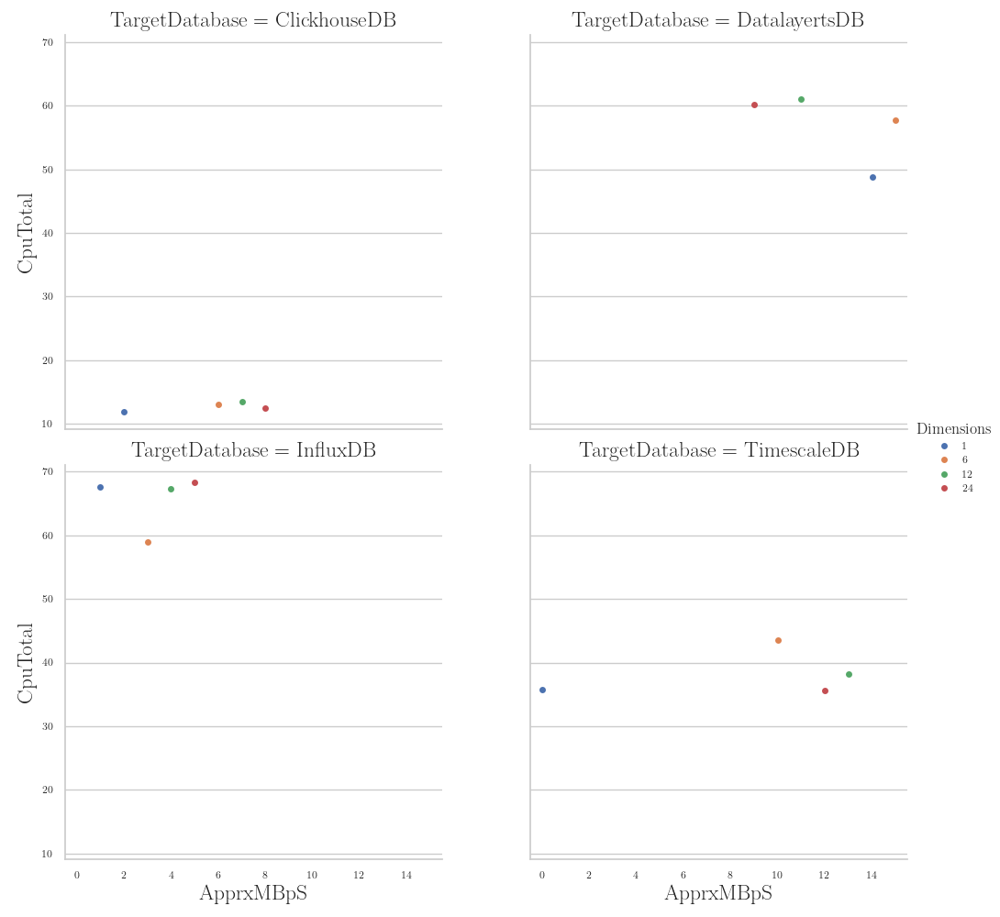

In [ ]:
print("DIMefficinecy")

atest = Combinded_ingestion.loc[Combinded_ingestion.Mode.str.contains("ded")].loc[ Combinded_ingestion.TargetDatabase.str.contains("Dumm")==False ]
atest = atest.merge(top_rates_Ded_Ing, how="inner")
atest=atest.groupby(["TargetDatabase","Dimensions"] ).mean( {"ApprxMBpS","CpuTotal"})
plt.figure("Dim Efficiency")
plt.title("Efficiency of various data transmission cardinalities")
sns.catplot(atest,kind="swarm",col="TargetDatabase",col_wrap=3, x="ApprxMBpS", y="CpuTotal", hue="Dimensions", palette="deep")
plt.xscale("linear")
plt.yscale("linear")
plt.savefig(path+'DIM-BANDWDTH-vs-CPU-TOP_AVG-scatter.svg', format='svg')
plt.show()
plt.close()

## Scaling: How does the System behave with long-term ingestion?
### ingestion rate

In [ ]:
# scaling_ingestion=results.loc[results["Mode"].str.contains["pop"]].assign(AlreadyIngested=results.groupby(['TargetDatabase'])["ValueArrays"].cumsum()  )


# # plt.figure("TopConfig-scaling-Latency")
# # plt.title("TopConfig scaling Latency")
# sns.lineplot(data=scaling_ingestion , x="AlreadyIngested", y="ApprxMBpS", hue="TargetDatabase", style="Mode", markers=True, dashes=False)
# plt.savefig(path+'scaleTopLatency.svg', format='svg')
# plt.show()
# plt.close()

### storage


In [ ]:
# #diskusage since ingestionstart
# scaling_storage=scaling_ingestion.assign(FsUsed= lambda x: x.FsSize-x.FsFree)

# plt.figure("scaling-Storage")
# plt.title("  scaling Storage. Approximation, as some systemmetrics packets go lost in Transmission")
# sns.lineplot(data=scaling_storage , x="AlreadyIngested", y="FsUsed", hue="Database",  markers=True, dashes=False) #style="Mode",    .loc[scaling_storage['AlreadyIngested']>100]
# plt.savefig(path+'scaleStorage.svg', format='svg')
# plt.show()
# plt.close()

### CPU  

In [ ]:
# plt.figure("scaling-CPU")
# plt.title("  scaling CPU")
# sns.lineplot(data=scaling_storage , x="AlreadyIngested", y="CpuTotal", hue="Database",  markers=True, dashes=False) #style="Mode",    .loc[scaling_storage['AlreadyIngested']>100]
# plt.savefig(path+'scaleCPU.svg', format='svg')
# plt.show()
# plt.close()

### memory

In [ ]:
# plt.figure("scaling-Mem")
# plt.title("  scaling Mem")
# sns.lineplot(data=scaling_storage , x="AlreadyIngested", y="MemUsed", hue="Database",  markers=True, dashes=False) #style="Mode",    .loc[scaling_storage['AlreadyIngested']>100]
# plt.savefig(path+'scaleMem.svg', format='svg')
# plt.show()
# plt.close()

In [ ]:
# plt.figure("scaling-SWap")
# plt.title("  scaling Swap")
# sns.lineplot(data=scaling_storage , x="AlreadyIngested", y="SwapUsed", hue="Database",  markers=True, dashes=False) #style="Mode",    .loc[scaling_storage['AlreadyIngested']>100]
# plt.savefig(path+'scaleSwap.svg', format='svg')
# plt.show()
# plt.close()

# Queries 


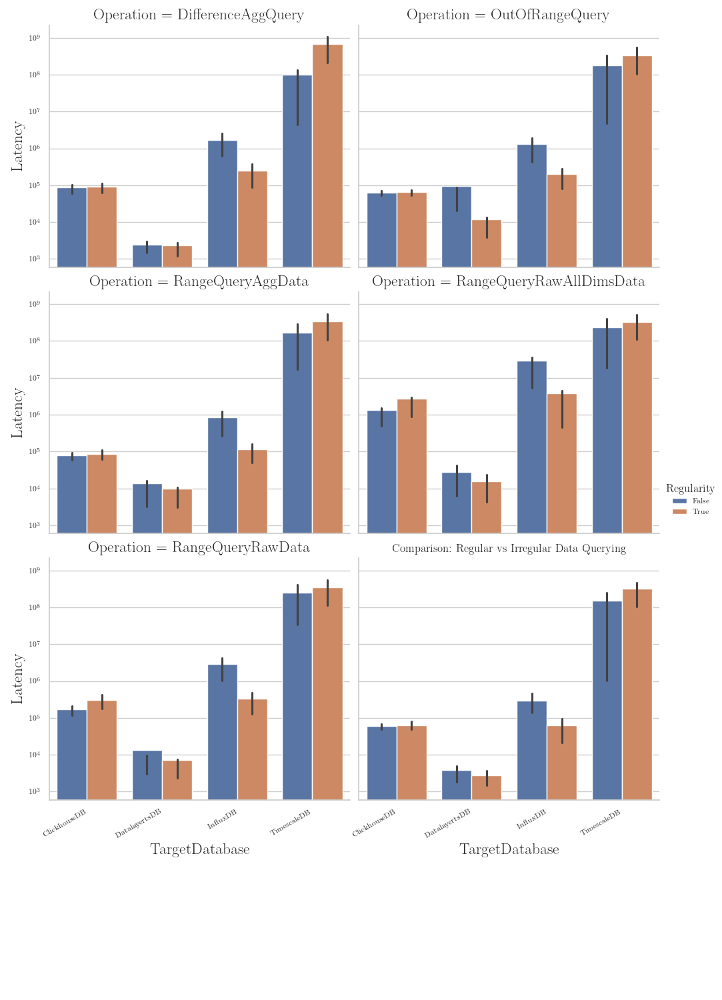

In [ ]:

resultQueries= result_ratesQ_Ded.assign(TargetDatabaseModes=lambda x: x.TargetDatabase+", "+x.Mode)
# .assign(OperationModes= lambda x: x.Operation+", "+x.Mode)


sns.catplot(data=resultQueries, x="TargetDatabase", y="Latency",  hue="Regularity",
            kind="bar", col="Operation", col_wrap=3, errorbar=("pi", 50))
plt.yscale('log')
plt.gcf().autofmt_xdate()
plt.title("Comparison: Regular vs Irregular Data Querying  ")
plt.savefig(path+'Q_rates_regularity-Latency-Operation.svg', format='svg')
plt.show()
plt.close()

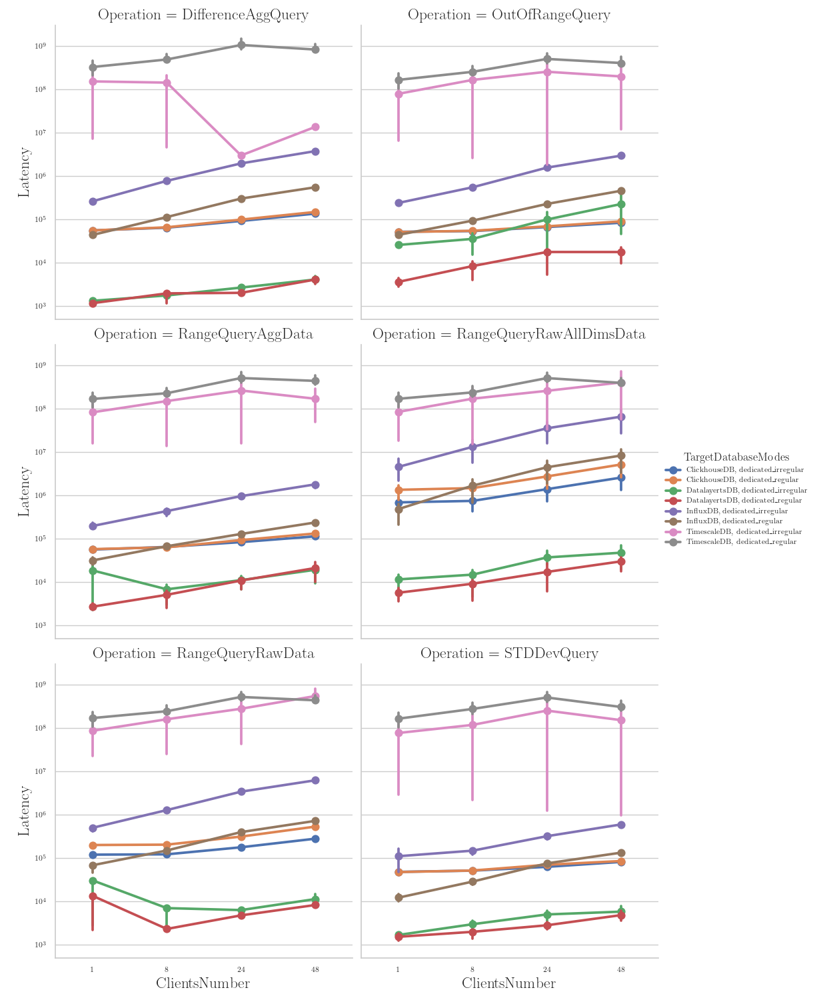

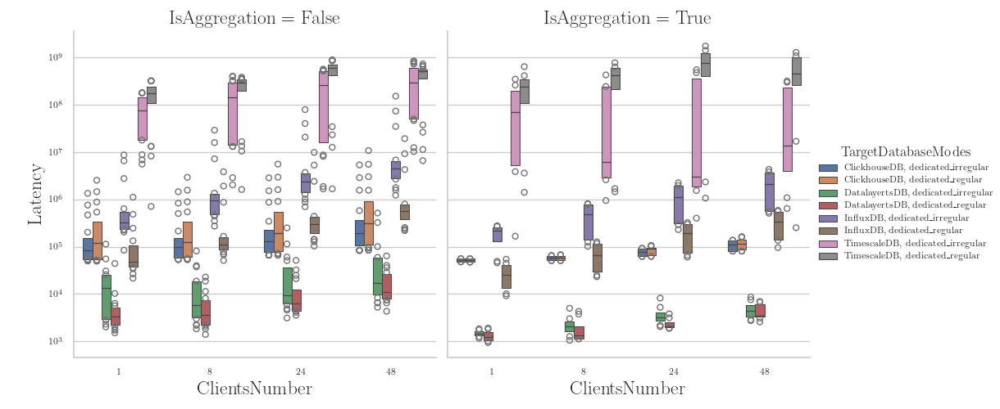

In [ ]:


# #Batchsize

sns.catplot(data=resultQueries, x="ClientsNumber", y="Latency",  hue="TargetDatabaseModes",
            kind="point", col="Operation", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Q_rates_reg-All-CN.svg', format='svg')
plt.show()
plt.close()


 

sns.catplot(data=resultQueries, x="ClientsNumber", y="Latency",  hue="TargetDatabaseModes",
            kind="boxen", col="IsAggregation", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Q_rates_reg-AggIO-CN.svg', format='svg')
plt.show()
plt.close()


Empty DataFrame
Columns: [TargetDatabase, Mode, Operation, ClientsNumber, BatchSize_x, Duration, Dimensions, Percentage_x, Latency, ClientLatency, SucceededDataPoints, ValueArrays_x, ValuePoints_x, PointsPerMicroS, ApprxMBpS, ApprxMBpS_with_Client, BS_CN_x, Regularity_x, Consecutive-Batches_x, Mixed_x, IsAggregation, TargetDatabaseModes_x, Timestamp, BatchSize_y, Percentage_y, SensorsNumber, CpuTotal, CpuSystem, CpuUser, CpuIOWait, CpuContextSwitches, CpuSysCalls, MemActive, MemAvailable, MemBuffers, MemCached, MemFree, MemInActive, MemTotal, MemShared, MemUsed, SwapFree, SwapSin, SwapSout, SwapTotal, SwapUsed, DiskReadBytes, DiskReadCount, DiskWriteBytes, DiskWriteCount, FsFree, FsPercent, FsSize, FsUsage, NetworkCumulativeConnections, NetworkCumulativeReceives, NetworkCumulativeTransmissions, NetworkConnections_bps, NetworkTransmissions, NetworkReceives, NetworkIsUp, NetworkSpeed, ProcessCpuPercent, ProcessMemoryPercent, ProcessThreadsNumber, BS_CN_y, ValueArrays_y, ValuePoints_y, Re

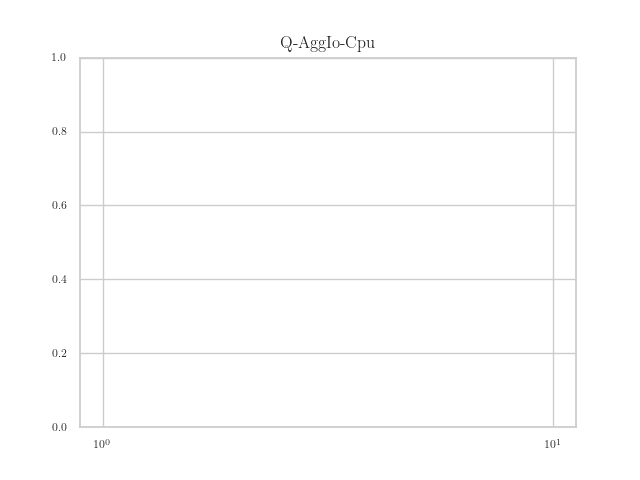

In [ ]:
# print(resultQueries)


combinedQ= resultQueries.merge(systemmetricsDED, how= 'inner', on=['TargetDatabase','Mode','Operation','ClientsNumber','Dimensions'] )

print(combinedQ)
plt.figure("Q-AggIo-Cpu")
plt.title("Q-AggIo-Cpu")
sns.scatterplot(combinedQ, x="TargetDatabase", y="CpuTotal", hue="IsAggregation", style="Mode")
plt.xscale("log")
plt.savefig(path+'Q_rates-AggIo-Cpu.svg', format='svg')
plt.show()
plt.close()



In [ ]:
# latency


show_query_stat('RangeQueryRawData')
show_query_stat('RangeQueryRawAllDimsData')

/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)
/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


In [ ]:
show_query_stat('OutOfRangeQuery')

/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


In [ ]:
show_query_stat('STDDevQuery')

/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


In [ ]:
show_query_stat('RangeQueryAggData')

/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


In [ ]:
show_query_stat('DifferenceAggQuery')

/tmp/ipykernel_9800/4220821250.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


/tmp/ipykernel_9800/4220821250.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ['Mode', "TargetDatabase"]).apply(_query_stat)


## Multidim Query stats

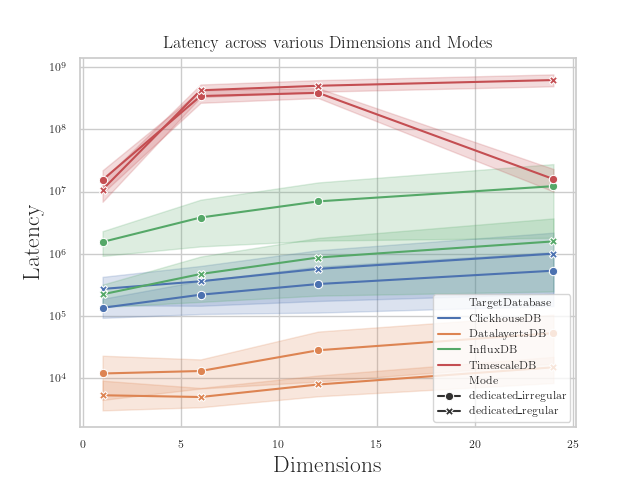

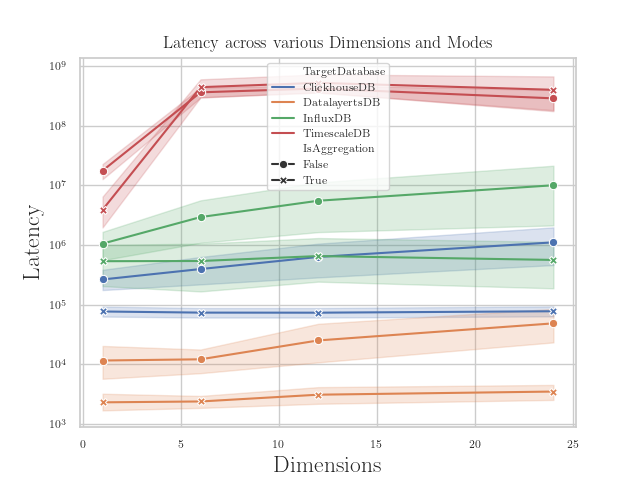

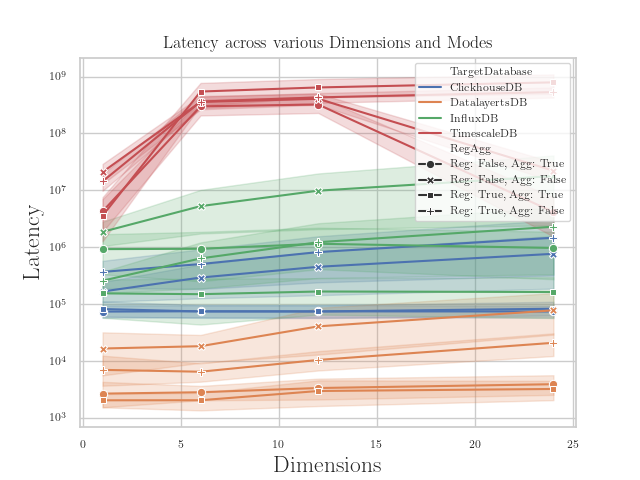

In [ ]:

plt.figure("Q-Dim-Mode")
plt.title("Latency across various Dimensions and Modes")

sns.lineplot(data=result_ratesQ_Ded , x="Dimensions", y="Latency", hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.yscale('log')
plt.savefig(path+'Q-Dim-Reg.svg', format='svg')  # svg
plt.show()
plt.close()


plt.figure("Q-Dim-Mode")
plt.title("Latency across various Dimensions and Modes")

sns.lineplot(data=result_ratesQ_Ded, x="Dimensions", y="Latency", hue="TargetDatabase", style="IsAggregation", markers=True, dashes=False)
plt.yscale('log')
plt.savefig(path+'Q-Dim-Agg.svg', format='svg')  # svg
plt.show()
plt.close()

result_ratesQ_Ded_RegAgg = result_ratesQ_Ded.assign(RegAgg= lambda x: "Reg: "+x.Regularity.replace({True: 'True', False: 'False'}) + ", Agg: " + x.IsAggregation.replace({True: 'True', False: 'False'}) )

plt.figure("Q-Dim-Mode")
plt.title("Latency across various Dimensions and Modes")

sns.lineplot(data=result_ratesQ_Ded_RegAgg , x="Dimensions", y="Latency", hue="TargetDatabase", style="RegAgg", markers=True, dashes=False)
plt.yscale('log')
plt.savefig(path+'Q-Dim-Reg-Agg.svg', format='svg')  # svg
plt.show()
plt.close()

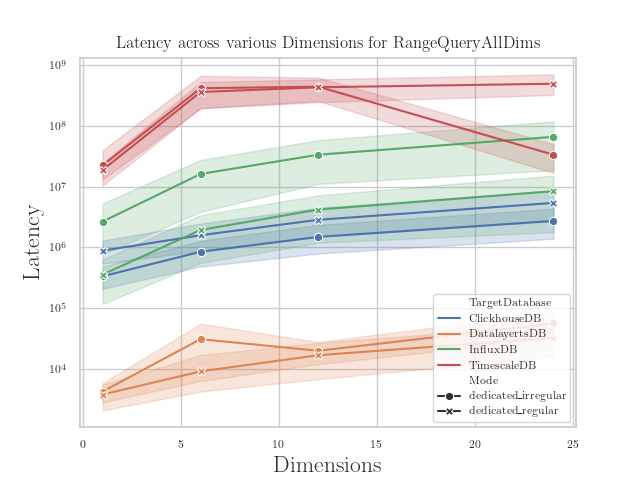

In [ ]:


plt.figure("Q-Dim-Op-A")
plt.title("Latency across various Dimensions for RangeQueryAllDims")

sns.lineplot(data=result_ratesQ_Ded.loc[result_ratesQ_Ded['Operation'].str.contains(
    'RangeQueryRawAllDimsData')], x="Dimensions", y="Latency", hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.yscale('log')
plt.savefig(path+'Q-Dim-Alldim.svg', format='svg')  # svg
plt.show()
plt.close()

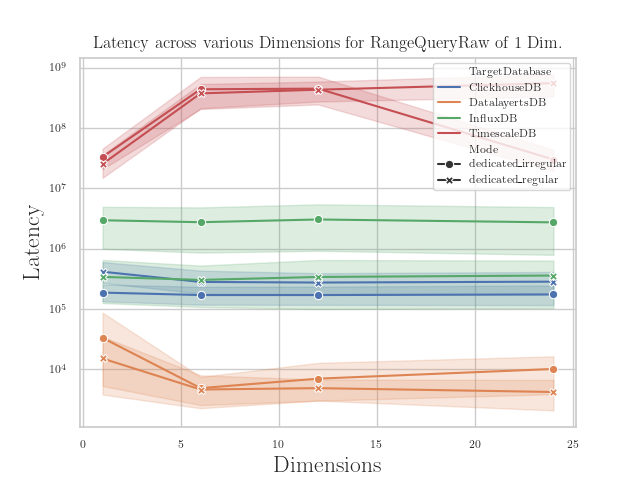

In [ ]:


plt.figure("Q-Dim-Op-1")
plt.title("Latency across various Dimensions for RangeQueryRaw of 1 Dim.")

sns.lineplot(data=result_ratesQ_Ded.loc[result_ratesQ_Ded['Operation'].str.contains('RangeQueryRawData')], x="Dimensions", y="Latency", hue="TargetDatabase", style="Mode", markers=True, dashes=False)
plt.yscale('log')
plt.savefig(path+'Q-Dim-oneDim.svg', format='svg')  # svg
plt.show()
plt.close()

## Query System Metrics


### regurlar vs irregular transaction system usage 


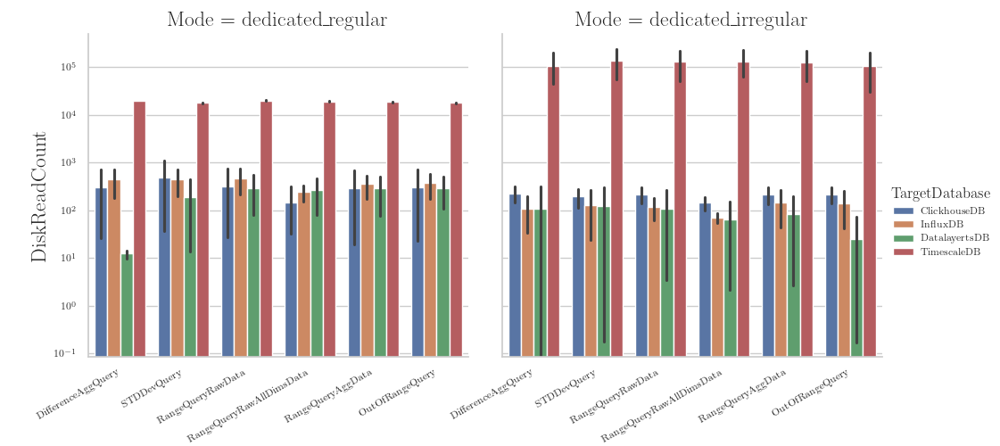

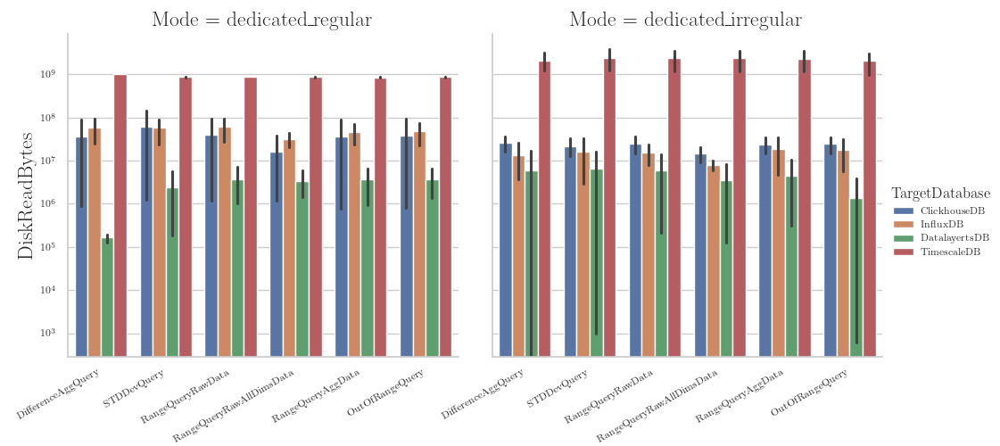

In [ ]:
systemmetricsDED_R = systemmetricsDED[systemmetricsDED['Operation'].str.contains( "Query")]


# plt.figure("Q-Disk-Read-COunt-OP")
sns.catplot(data=systemmetricsDED_R, kind="bar", x='Operation',
            y="DiskReadCount", hue="TargetDatabase", col='Mode')
plt.gcf().autofmt_xdate()
plt.yscale('log')

plt.savefig(path+'QreadCount.svg', format='svg')
plt.show()
plt.close()


# plt.figure("Qu-Disk-Read-Bytes-OP")
sns.catplot(data=systemmetricsDED_R, kind="bar", x='Operation',
            y="DiskReadBytes", hue="TargetDatabase", col='Mode')
plt.gcf().autofmt_xdate()
plt.yscale('log')

plt.savefig(path+'QreadBytes.svg', format='svg')
plt.show()
plt.close()

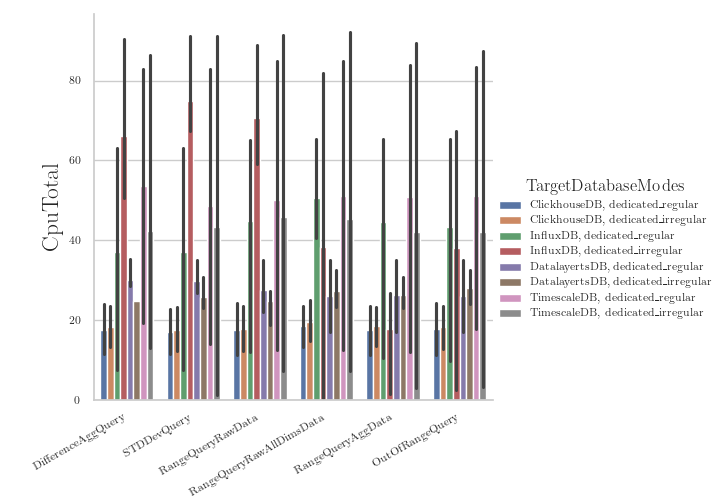

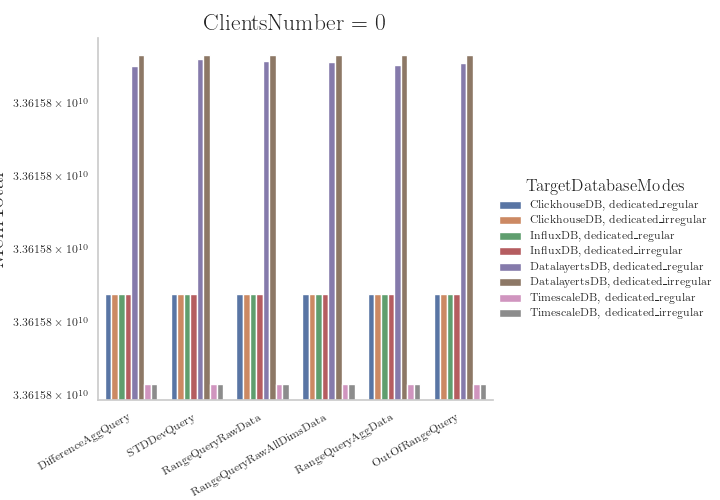

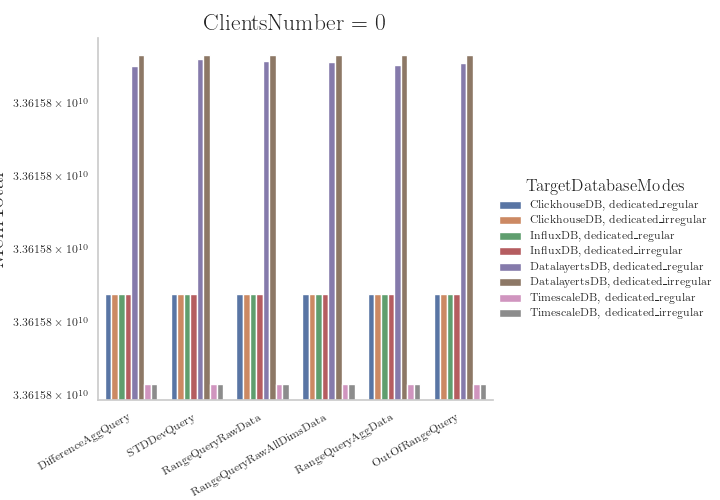

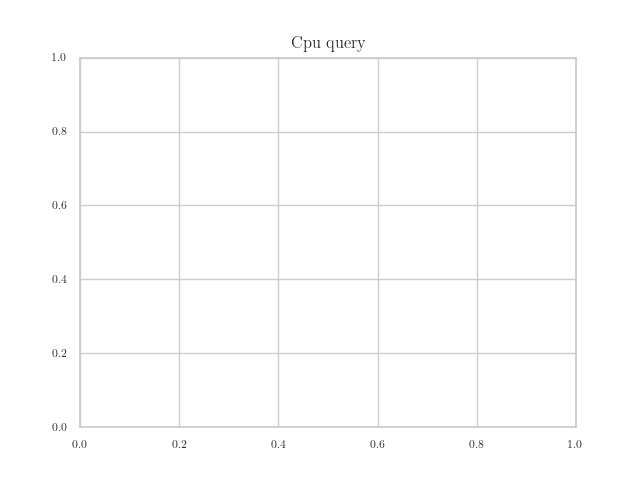

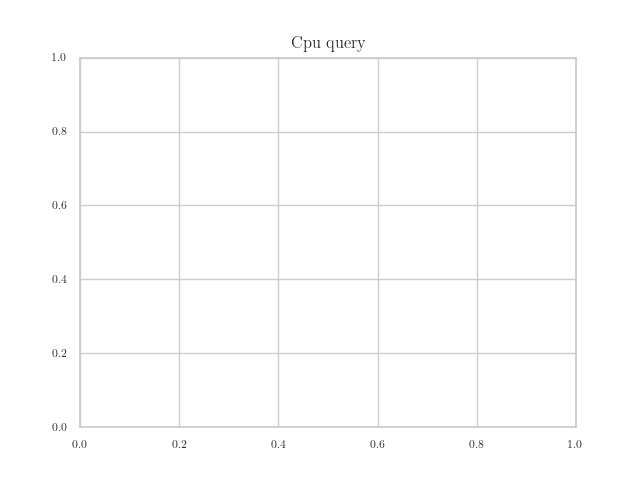

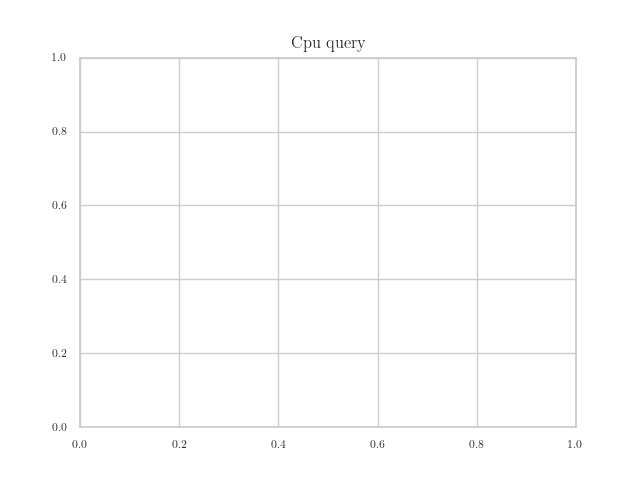

In [ ]:
systemmetricsDED_R = systemmetricsDED_R.assign(
    TargetDatabaseModes=lambda x: x.TargetDatabase+", "+x.Mode)


plt.figure("Q-CPU-OP")
plt.title("Cpu query")
sns.catplot(data=systemmetricsDED_R, kind="bar", x='Operation',
            y="CpuTotal", hue="TargetDatabaseModes", errorbar=("pi", 50))
plt.gcf().autofmt_xdate()
plt.savefig(path+'cpu-query.svg', format='svg')
plt.show()
plt.close()


plt.figure("Q-Mem-OP")
plt.title("Cpu query")
sns.catplot(data=systemmetricsDED_R, kind="bar", x='Operation',
            y="MemTotal", hue="TargetDatabaseModes",col='ClientsNumber', errorbar=("pi", 50))
plt.gcf().autofmt_xdate()
plt.yscale('log')

plt.savefig(path+'cpu-query.svg', format='svg')
plt.show()
plt.close()


plt.figure("Q-Mem-Mode-OP")
plt.title("Cpu query")
sns.catplot(data=systemmetricsDED_R, kind="bar", x="Operation",col='ClientsNumber', 
            y="MemTotal", hue="TargetDatabaseModes", errorbar=("pi", 50))
plt.gcf().autofmt_xdate()
plt.yscale('log')

plt.savefig(path+'cpu-query.svg', format='svg')
plt.show()
plt.close()

### multiDim transaction system usage

# Mixed, Online Workloads

In [ ]:


mixedWL_rates=results_rates.loc[results_rates.Mode.str.contains('mix')]
mixedWL_ratesI =mixedWL_rates.loc[mixedWL_rates.Operation.str.contains('Ing')]
mixedWL_ratesQ =mixedWL_rates.loc[mixedWL_rates.Operation.str.contains('Que')]


## Ingestion

under mixed WL


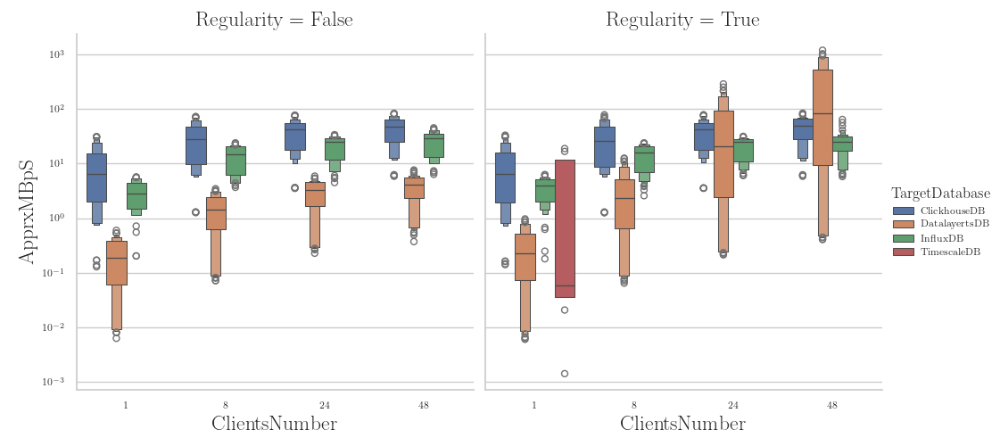

comp ded/mixed WL
ingest


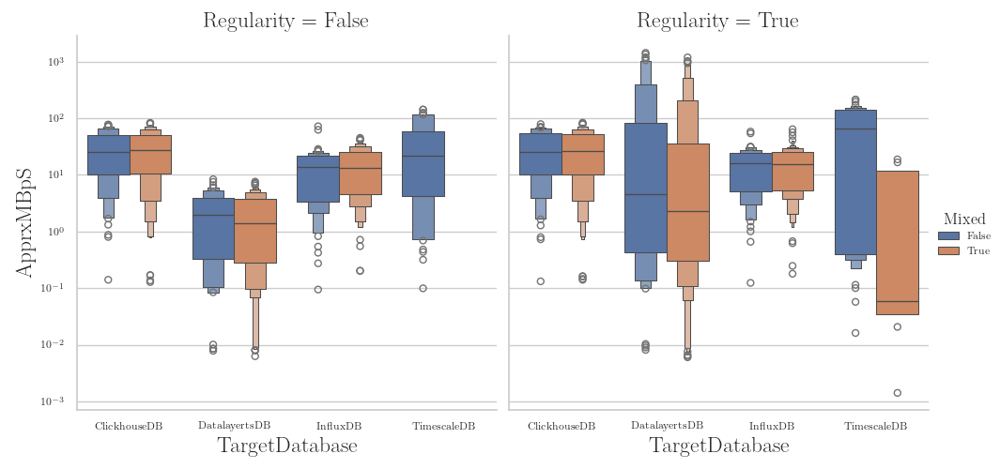

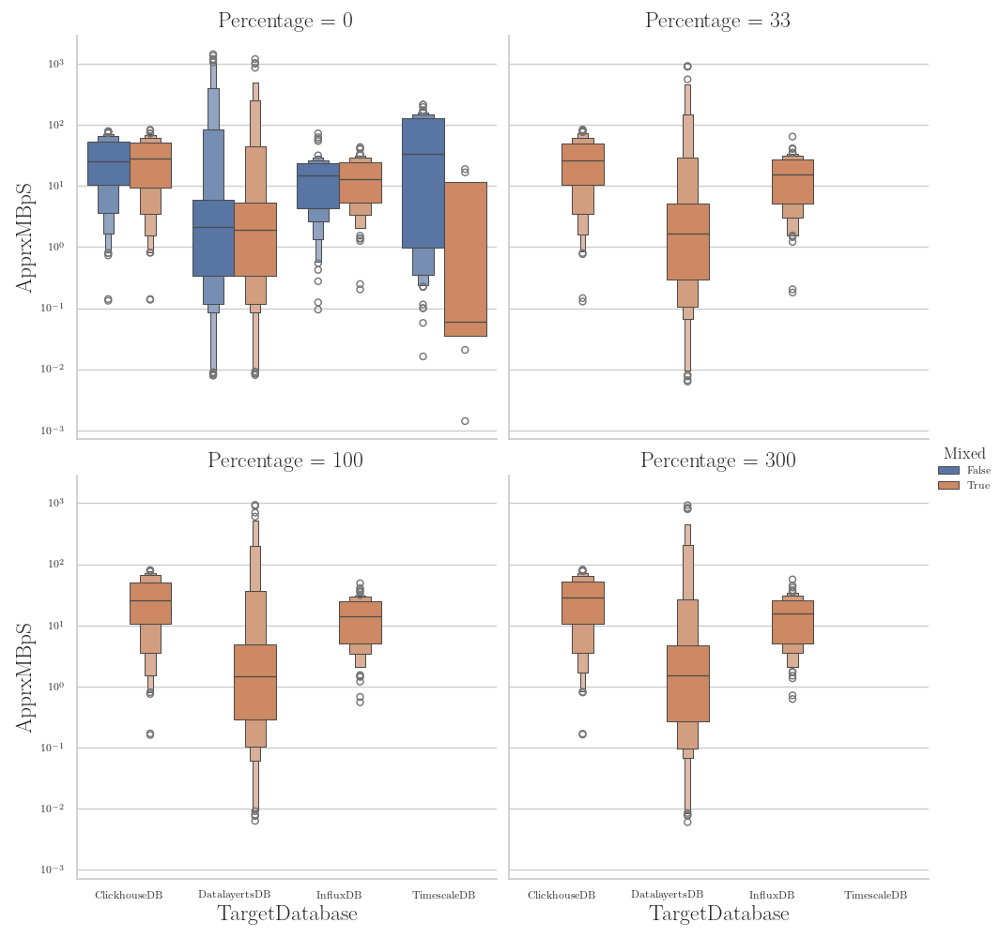

In [ ]:


 
print("under mixed WL")
sns.catplot(data=mixedWL_ratesI, x="ClientsNumber", y="ApprxMBpS",  hue="TargetDatabase",
            kind="boxen", col="Regularity", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-rates_.svg', format='svg')
plt.show()
plt.close()




 
print("comp ded/mixed WL")
print("ingest")
sns.catplot(data=results_ratesI, x="TargetDatabase", y="ApprxMBpS",  hue="Mixed",
            kind="boxen", col="Regularity", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

 

sns.catplot(data=results_ratesI, x="TargetDatabase", y="ApprxMBpS",  hue="Mixed",
            kind="boxen", col="Percentage", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-rates_DedMix_Perc.svg', format='svg')
plt.show()
plt.close()
 

## Query Attentions: RangeQ.:MixedQueries are Limited, Dedicated are Full

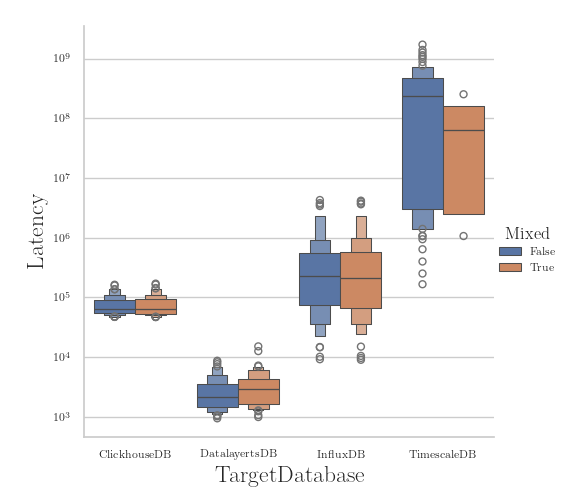

agg


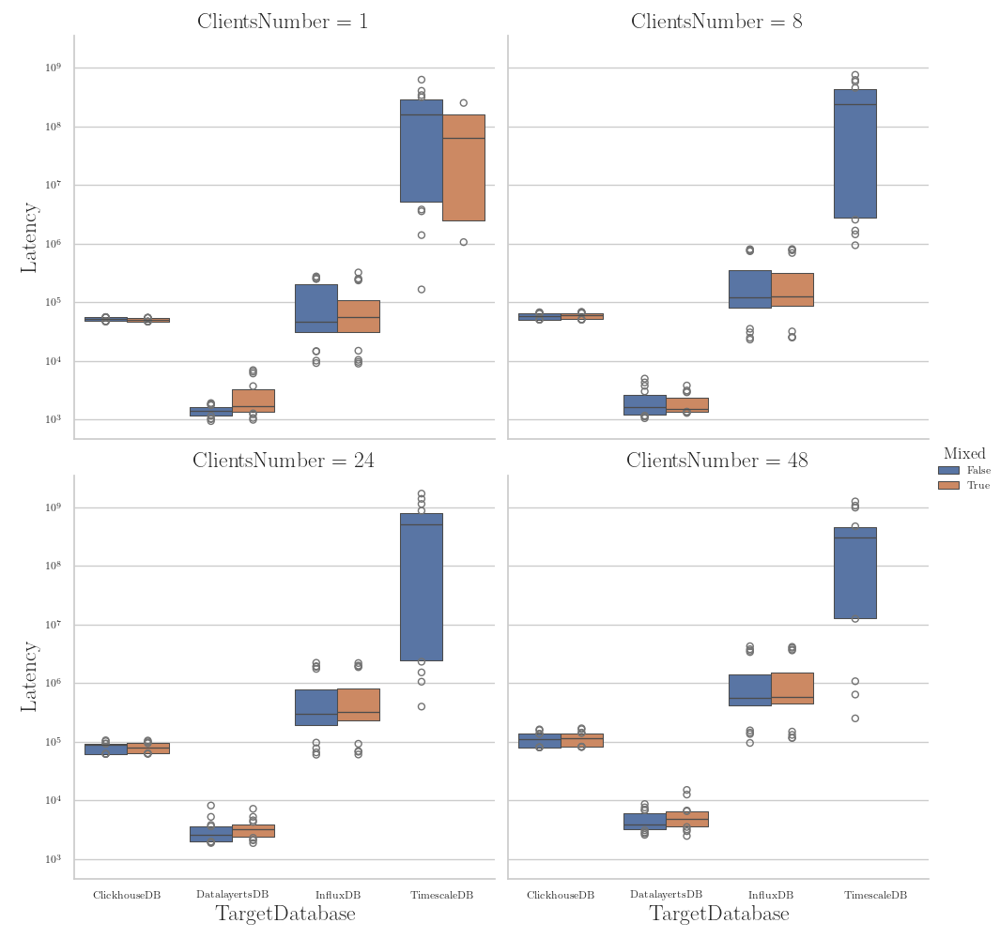

rangFul


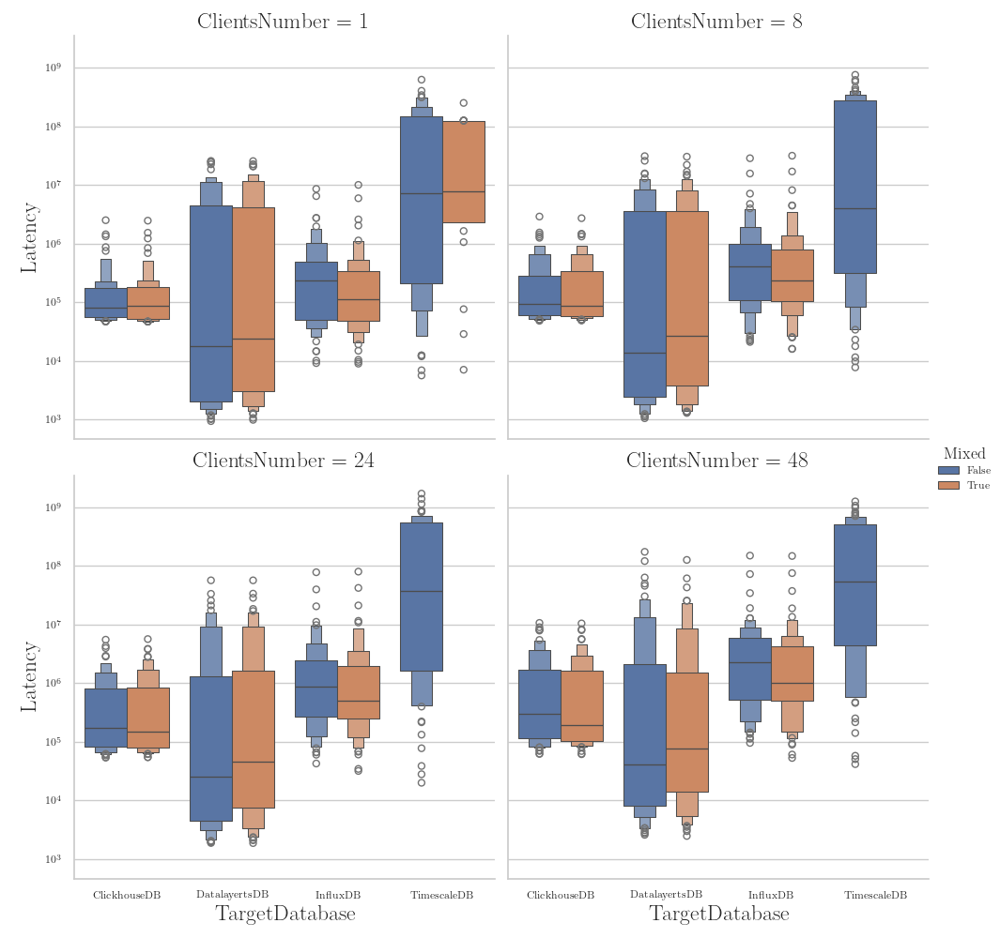

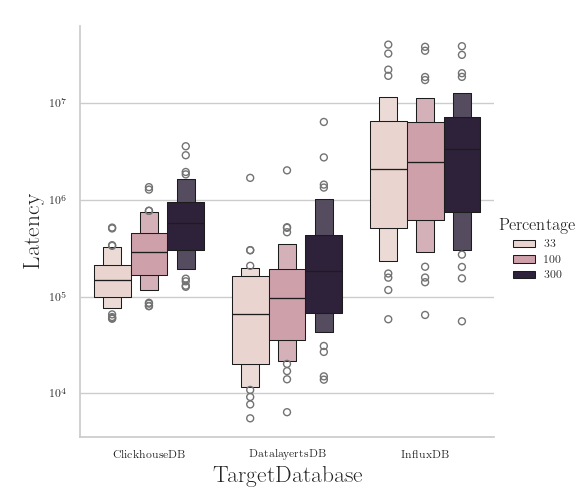

In [ ]:

 

sns.catplot(data=results_rates.loc[results_rates.Operation.str.contains('Qu') & (results_rates.Operation.str.contains('Rang')==False)], x="TargetDatabase", y="Latency",  hue="Mixed",
            kind="boxen",errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

print("agg")

sns.catplot(data=results_rates.loc[results_rates.Operation.str.contains('Qu') & (results_rates.Operation.str.contains('Rang')==False)], x="TargetDatabase", y="Latency",  hue="Mixed", col="ClientsNumber",col_wrap=3,
            kind="boxen",errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

print("rangFul")
 
 
sns.catplot(data=results_rates.loc[results_rates.Mode.str.contains('Limi')==False & (results_rates.Operation.str.contains('Rang')==True)], x="TargetDatabase", y="Latency",  hue="Mixed", col="ClientsNumber",col_wrap=3,
            kind="boxen",errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

sns.catplot(data=result_ratesQ.loc[result_ratesQ.Mode.str.contains('Limit')], x="TargetDatabase", y="Latency",  hue="Percentage",
            kind="boxen", errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()


## System Metrics

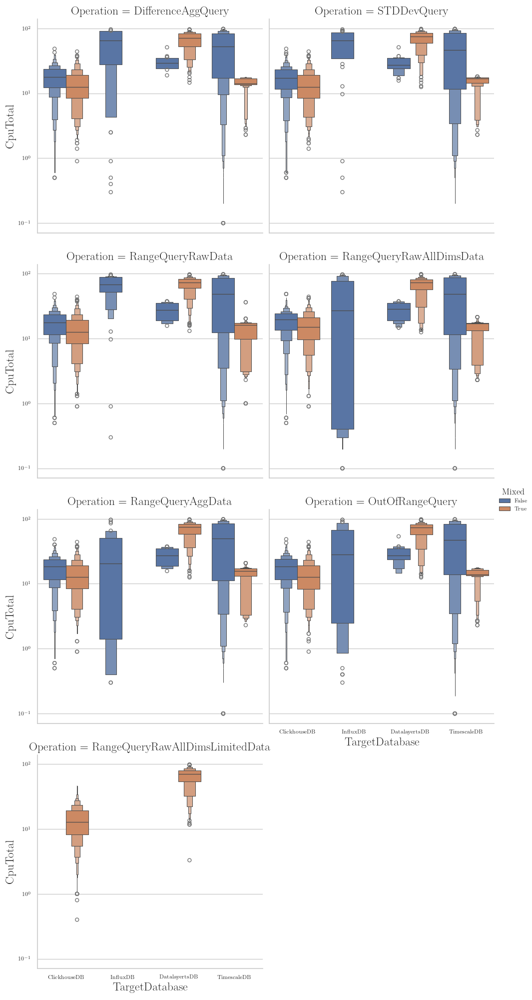

Agg


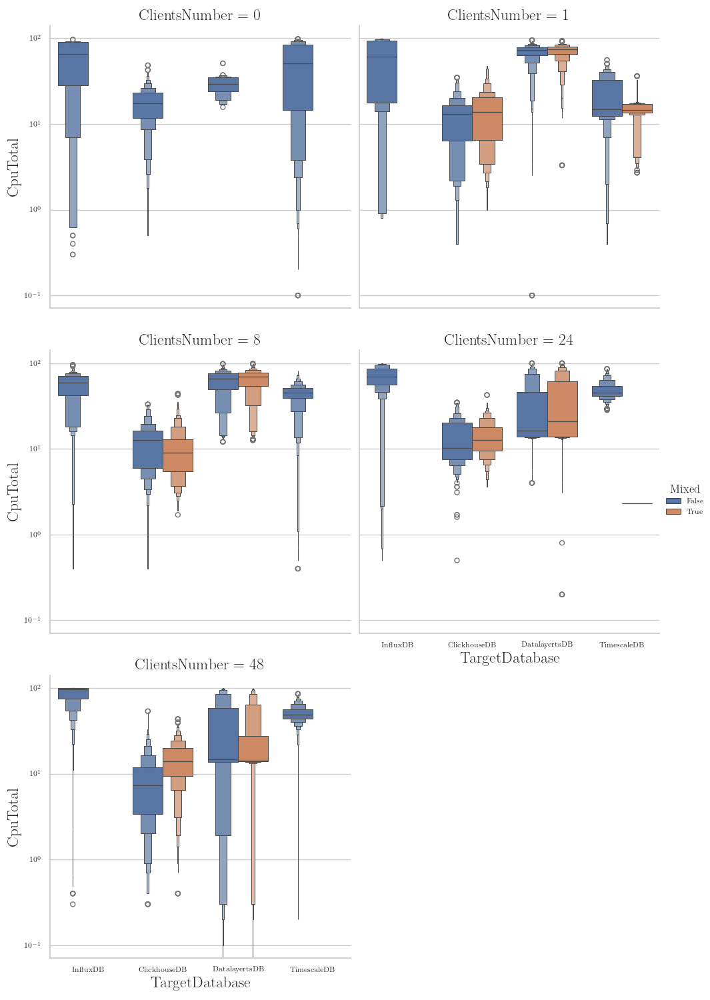

RangFull


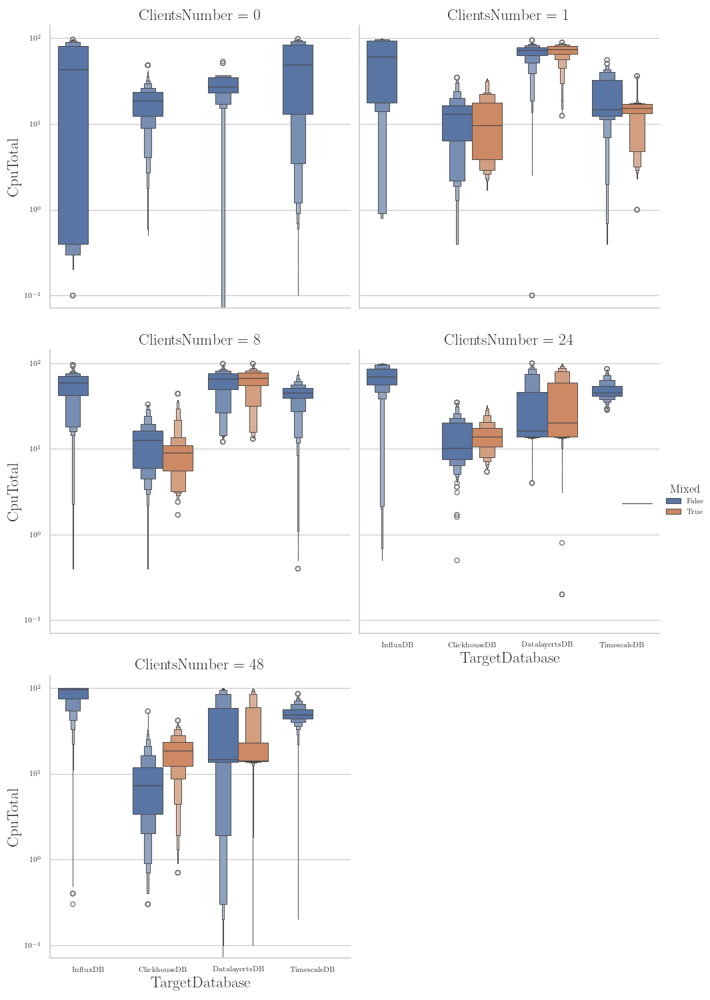

ingestion


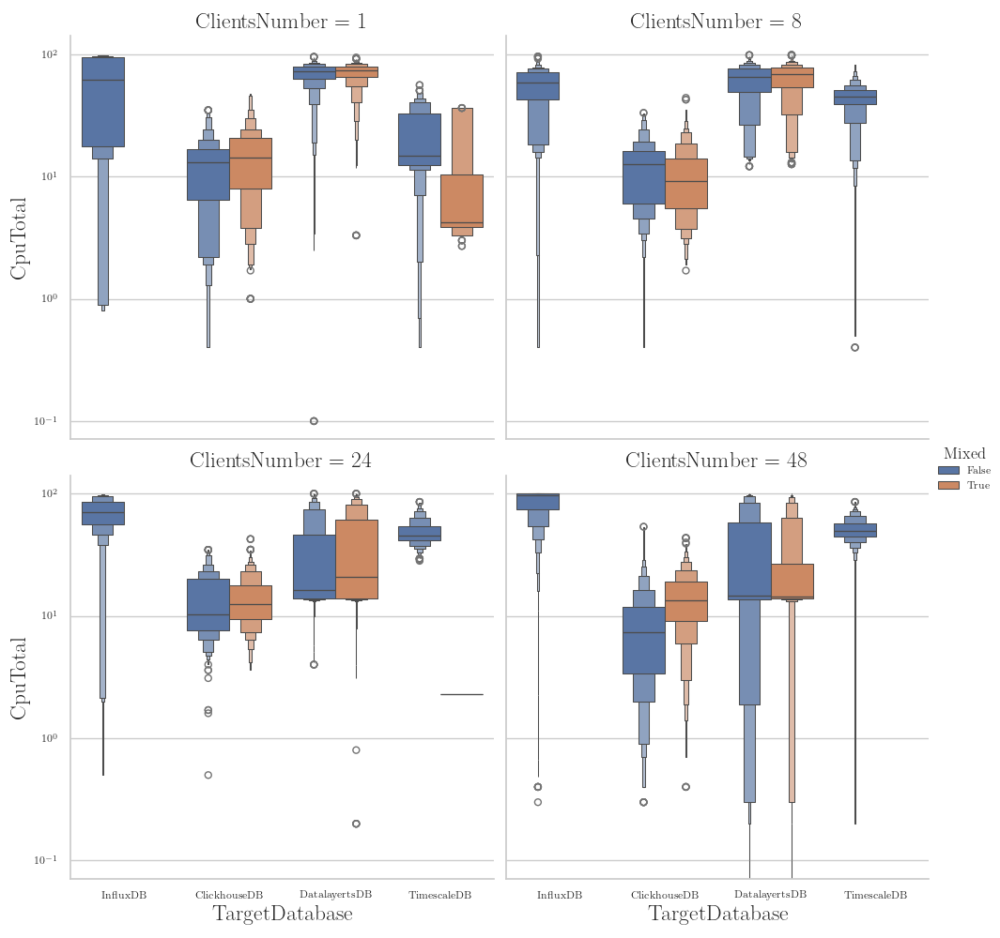

In [ ]:
# ok
#
#
systemmetrics['Mixed']= systemmetrics['Mode'].str.contains('mixed').map({True: True, False: False})

 

sns.catplot(data=systemmetrics.loc[systemmetrics.Operation.str.contains('Que')], x="TargetDatabase", y="CpuTotal",  hue="Mixed",
            kind="boxen", col="Operation", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sys-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

print("Agg")
sns.catplot(data=systemmetrics.loc[systemmetrics.Operation.str.contains('Que')&systemmetrics.Operation.str.contains('Rang')==False], x="TargetDatabase", y="CpuTotal",  hue="Mixed",
            kind="boxen", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-AGG-sys-rates_DedMix.svg', format='svg')
plt.show()
plt.close()
print("RangFull")
sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limi')==False&systemmetrics.Operation.str.contains('Rang')], x="TargetDatabase", y="CpuTotal",  hue="Mixed",
            kind="boxen", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-Range-sys-rates_DedMix.svg', format='svg')
plt.show()
plt.close()

print("ingestion")
sns.catplot(data=systemmetrics.loc[systemmetrics.Operation.str.contains('Ing')], x="TargetDatabase", y="CpuTotal",  hue="Mixed",
            kind="boxen", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-sys-rates_DedMix.svg', format='svg')
plt.show()
plt.close()





ing


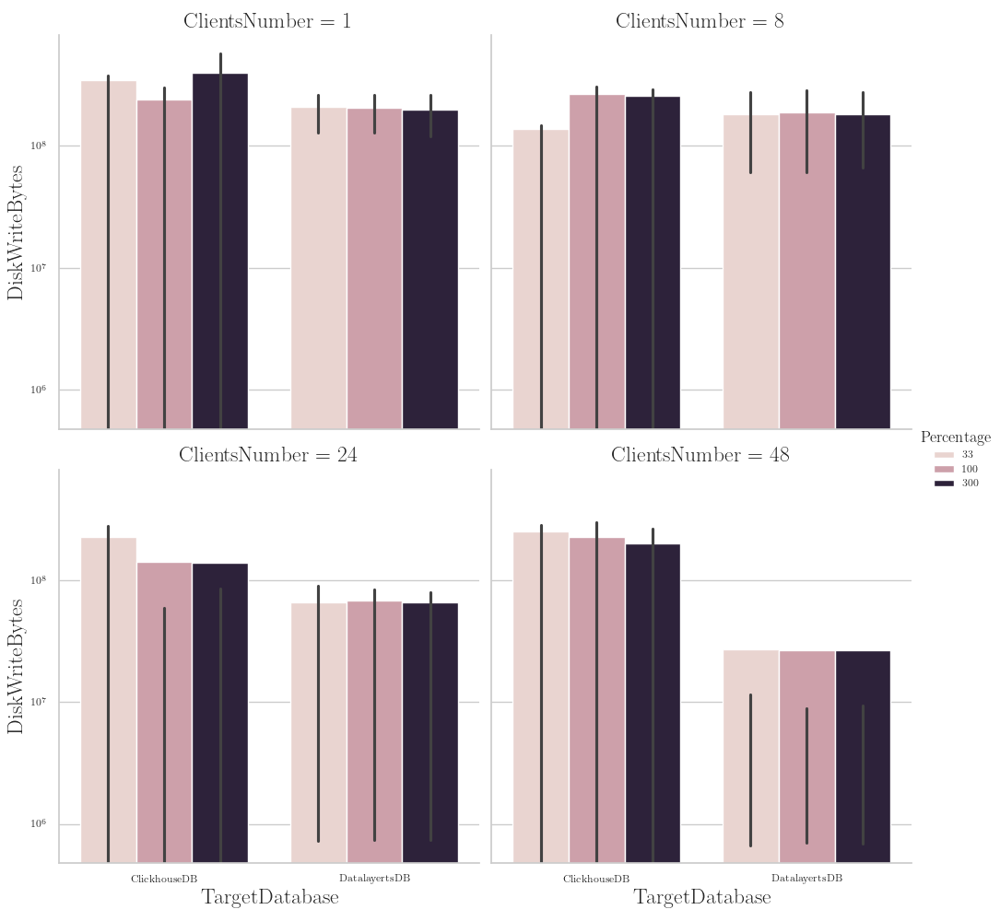

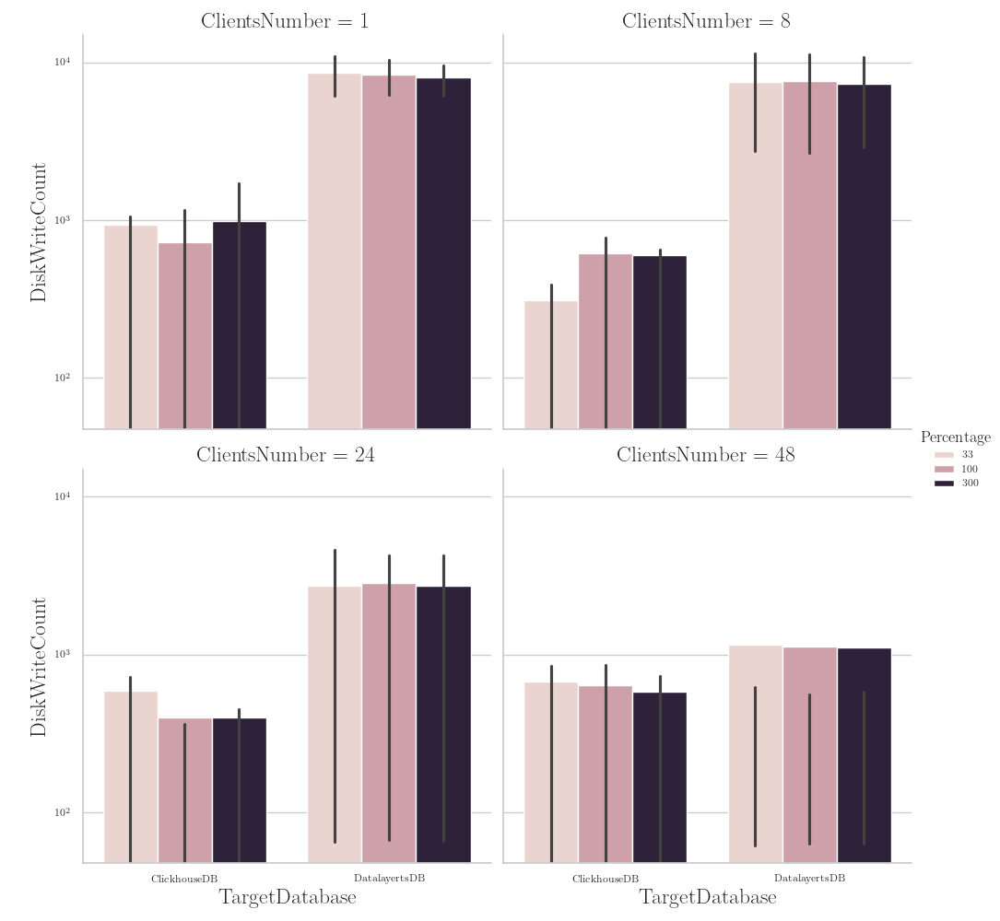

que


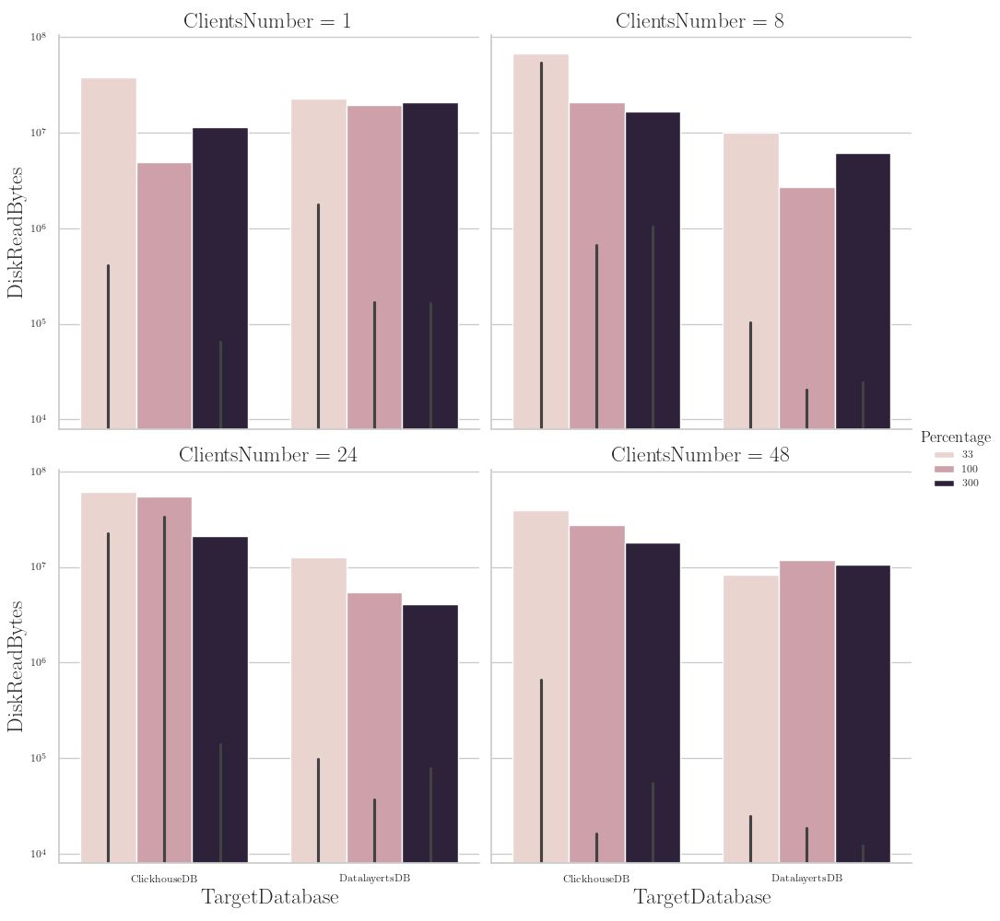

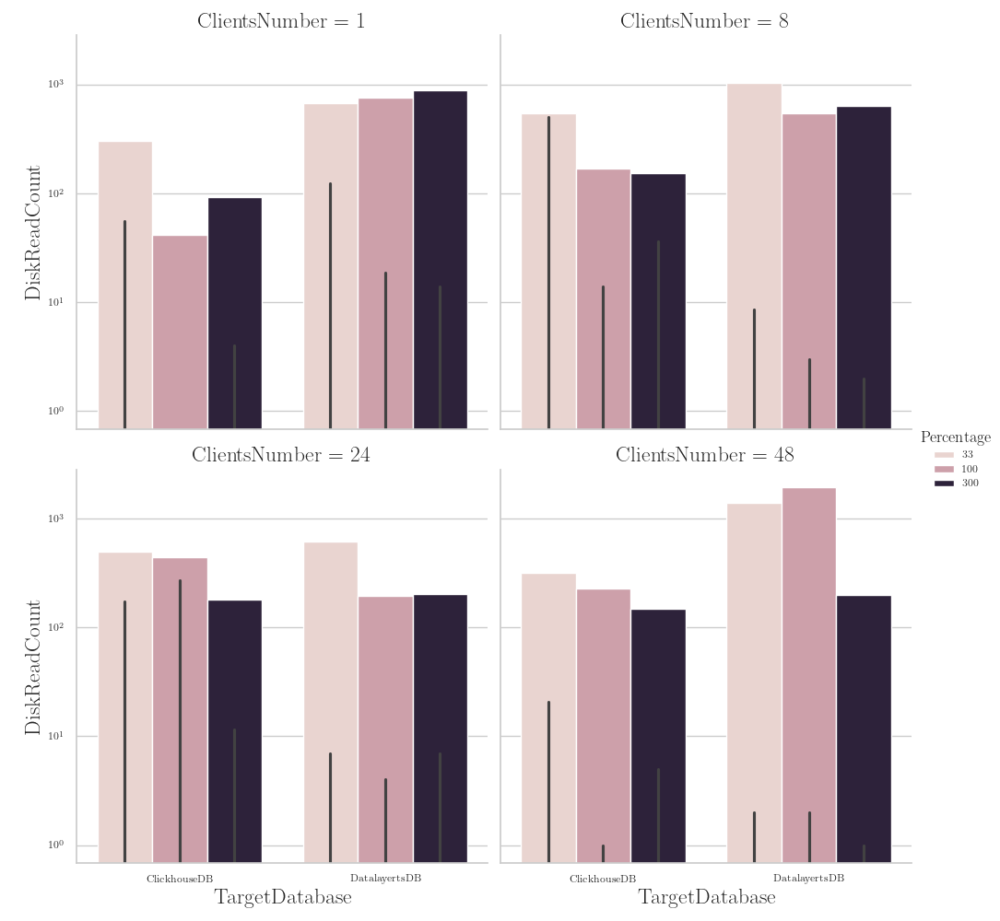

In [ ]:
print("ing")
sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')&systemmetrics.Operation.str.contains("Ing")], x="TargetDatabase", y="DiskWriteBytes",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-sysDiskWrites-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()

sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')&systemmetrics.Operation.str.contains("Ing")], x="TargetDatabase", y="DiskWriteCount",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-I-sysDiskCount-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()
print("que")
sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')&systemmetrics.Operation.str.contains("Q")], x="TargetDatabase", y="DiskReadBytes",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysDiskReads-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()

sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')&systemmetrics.Operation.str.contains("Q")], x="TargetDatabase", y="DiskReadCount",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysDiskCount-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()

# 
#
#
#
#


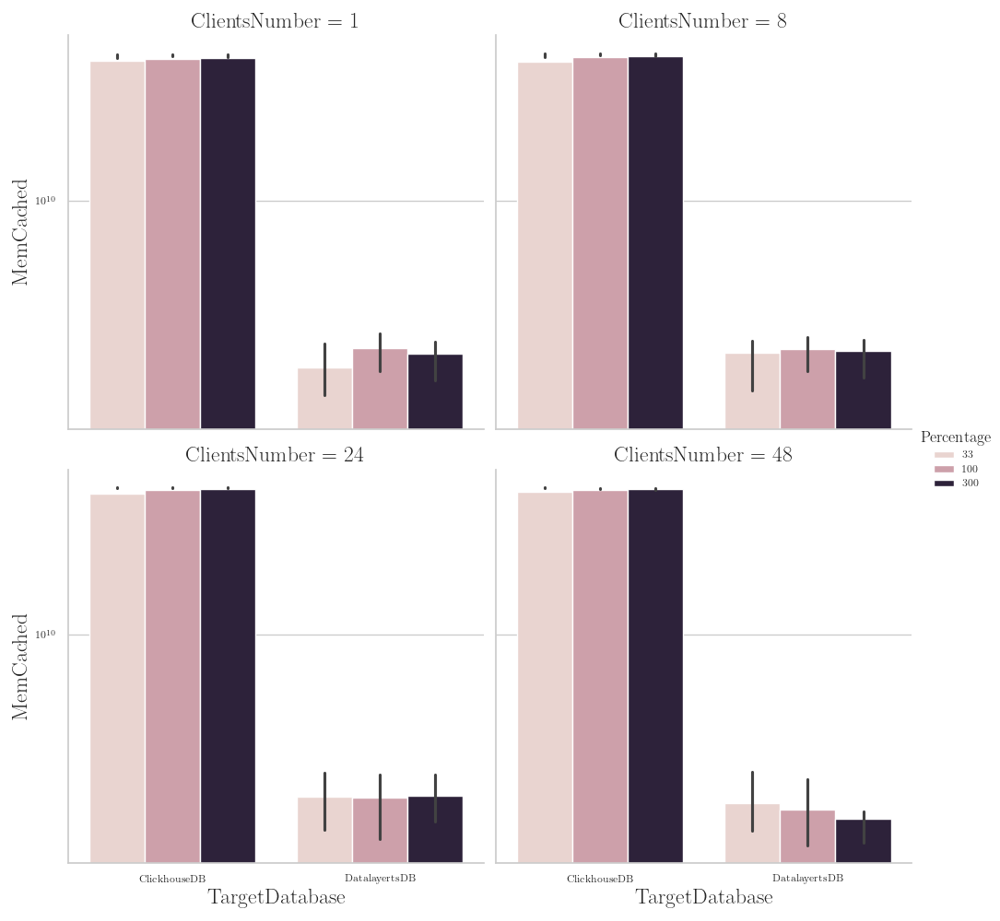

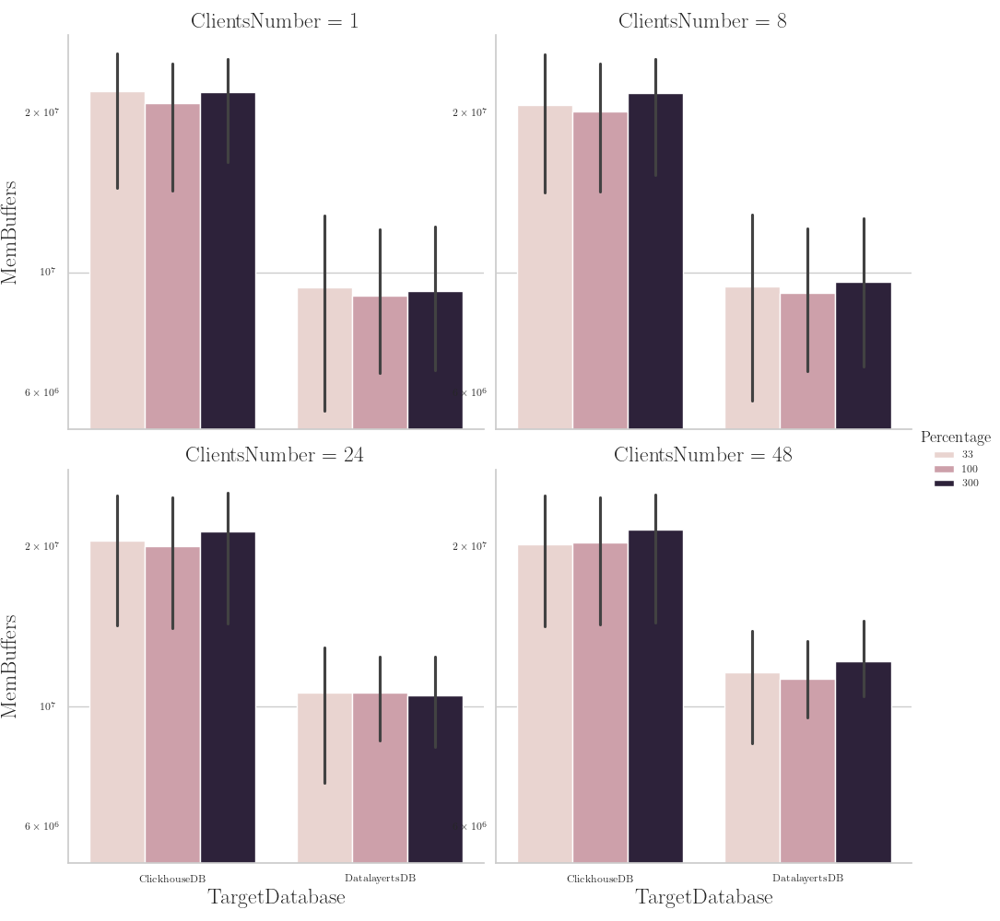

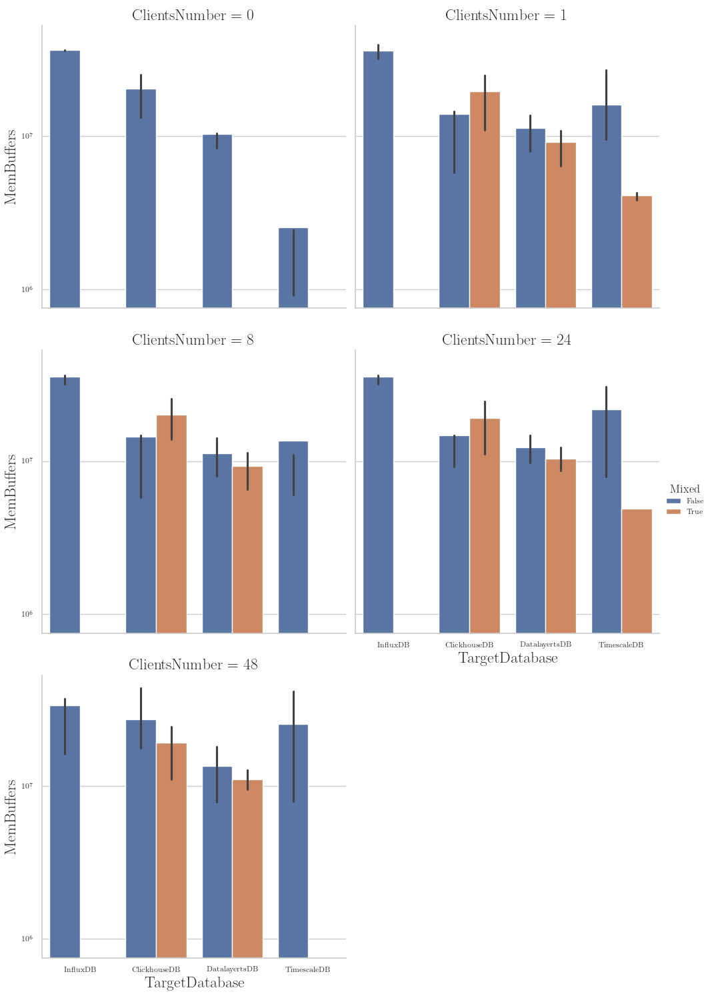

In [ ]:

sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')], x="TargetDatabase", y="MemCached",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysMemCache-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()
sns.catplot(data=systemmetrics.loc[systemmetrics.Mode.str.contains('Limit')], x="TargetDatabase", y="MemBuffers",  hue="Percentage",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysMemTotal-rates_DedMix_perc.svg', format='svg')
plt.show()
plt.close()
print("RangeFul")
sns.catplot(data=systemmetrics.loc[systemmetrics.Operation.str.contains('Ran') & systemmetrics.Mode.str.contains('Lim')==False  ], x="TargetDatabase", y="MemBuffers",  hue="Mixed",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysMemTotal-rates_DedMix_CN.svg', format='svg')
plt.show()
plt.close()
print("agg")
sns.catplot(data=systemmetrics.loc[systemmetrics.Operation.str.contains('Qu') & systemmetrics.Operation.str.contains('Rang')==False  ], x="TargetDatabase", y="MemBuffers",  hue="Mixed",
            kind="bar", col="ClientsNumber", col_wrap=3, errorbar=("pi", 50), )
plt.yscale('log')
# plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
plt.savefig(path+'Mix-Q-sysMemTotal-rates_DedMix_CN.svg', format='svg')
plt.show()
plt.close()

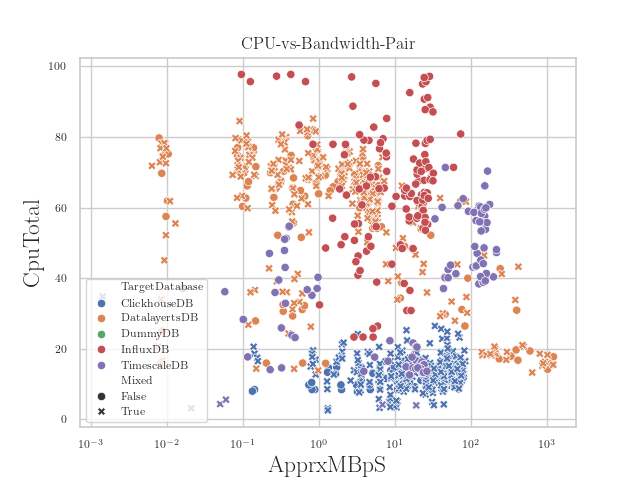

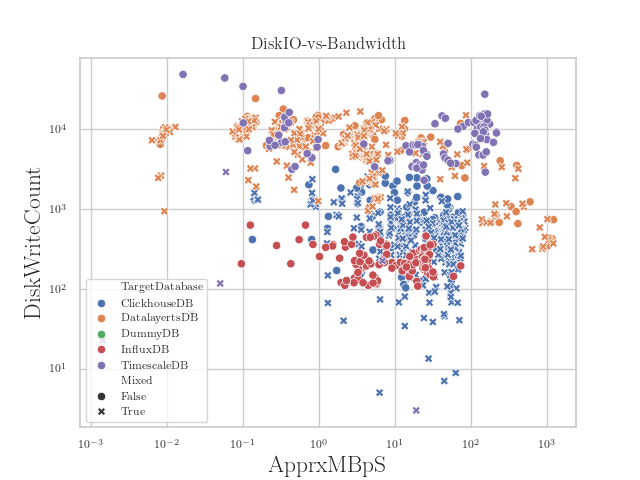

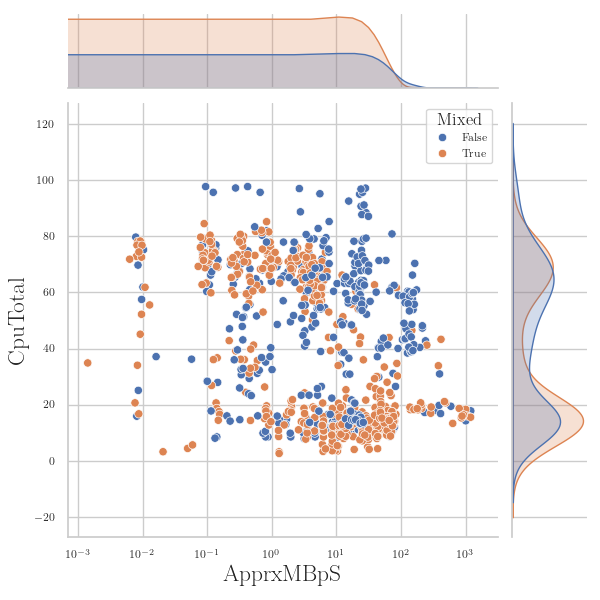

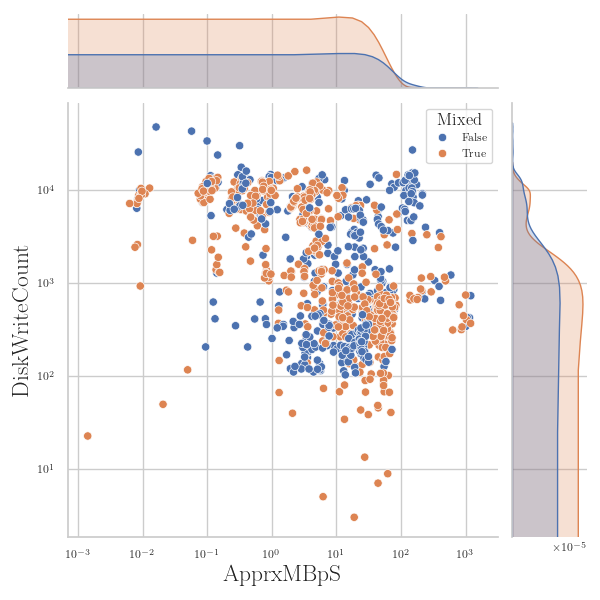

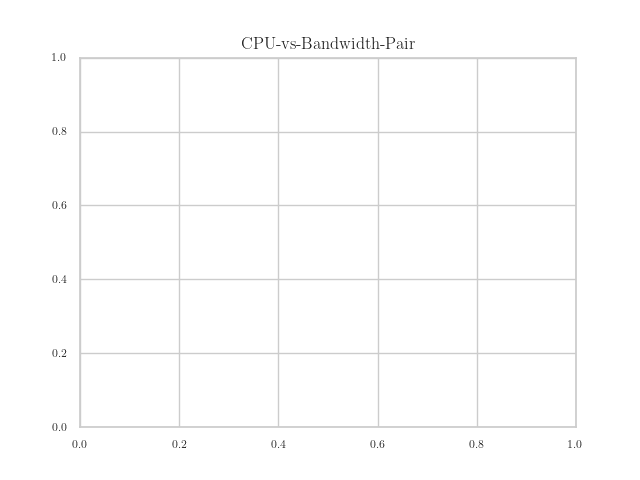

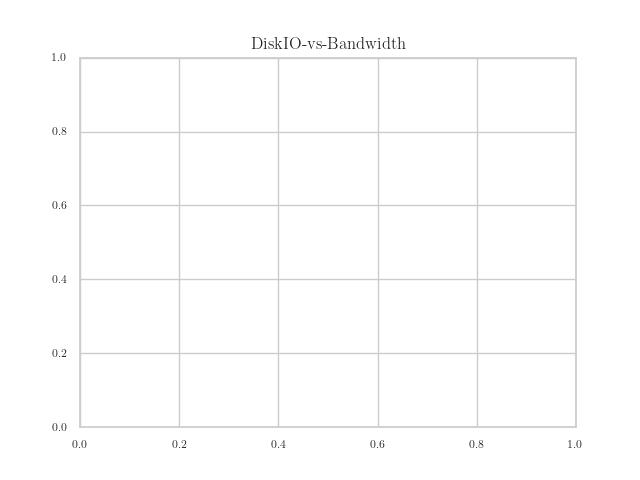

In [ ]:
plt.figure("CPU-vs-Bandwidth-Pair")
plt.title("CPU-vs-Bandwidth-Pair")
sns.scatterplot(Combinded_ingestion, x="ApprxMBpS", y="CpuTotal", hue="TargetDatabase", style="Mixed")
plt.xscale("log")
plt.savefig(path+'MixI-CPU-vs-Bandwidth_Pair.svg', format='svg')
plt.show()
plt.close()


plt.figure("DiskIO-vs-Bandwidth")
plt.title("DiskIO-vs-Bandwidth")
sns.scatterplot(Combinded_ingestion, x="ApprxMBpS", y="DiskWriteCount", hue="TargetDatabase", style="Mixed")
plt.xscale("log")
plt.yscale("log")
plt.savefig(path+'MixI-DiskIO-vs-Bandwidth-scatter.svg', format='svg')
plt.show()
plt.close()


plt.figure("CPU-vs-Bandwidth-Pair")
plt.title("CPU-vs-Bandwidth-Pair")
sns.jointplot(Combinded_ingestion, x="ApprxMBpS", y="CpuTotal", hue="Mixed" )
plt.xscale("log")
plt.savefig(path+'MIxI-joint-CPU-vs-Bandwidth_Pair.svg', format='svg')
plt.show()
plt.close()


plt.figure("DiskIO-vs-Bandwidth")
plt.title("DiskIO-vs-Bandwidth")
sns.jointplot(Combinded_ingestion, x="ApprxMBpS", y="DiskWriteCount", hue="Mixed" )
plt.xscale("log")
plt.yscale("log")
plt.savefig(path+'MixI-joint-DiskIO-vs-Bandwidth-.svg', format='svg')
plt.show()
plt.close()




#  Storage

In [ ]:
# gruppiere alle consecutiven TS-DB compos für popDay
# 



consecutives = systemmetrics['Timestamp','TargetDatabase'].diff().ne(0).cumsum()
# df['a'].groupby(consecutives).agg(list)

# storage= systemmetrics.loc[systemmetrics.Mode.str.contains("pop")&systemmetrics.Operation.str.contains("Ing")].groupby(['Timestamp','TargetDatabase', 'Regularity','Dimensions'], as_index=False).max().assign(FsFull= lambda x: (x.FsSize-x.FsFree) / 1000000 )


# sns.catplot(data=storage, x="TargetDatabase", y="FsFull",  hue="Regularity",
#             kind="bar", col="Dimensions", col_wrap=3, errorbar=("pi", 50), )
# plt.yscale('linear')
# # plt.title("Comparison: Regular vs Irregular Data Querying based on Number of Clients")
# plt.savefig(path+'Storage-Reg-Dim.svg', format='svg')
# plt.show()
# plt.close()





KeyError: ('Timestamp', 'TargetDatabase')

# 